# Simulating a model with MaBoSS

In [1]:
%matplotlib inline
import numpy as np
# import seaborn as sns; sns.set()

import ginsim
import biolqm
import maboss
from colomoto_jupyter import tabulate # for fixpoint table display
from itertools import combinations # for iterating over sets
import matplotlib.pyplot as plt # for modifying plots
import pandas as pd # for the visualization of lists of states
import os
import itertools
import time


In [626]:
import scipy as scipy
import scipy.cluster
from scipy.spatial import distance


In [83]:
from own_functions import *
from MaBoSSTestCase import *
import sys


# Functions

In [3]:
# function to run a model (defaultmodel) with different mutations and iinitial conditions

def fcn_multiple_experiments(defaultmodel,params_str_nested,paramsets,n_par,\
                             mutation_nodes,mutation_vals,initstate_nodes,initstate_vals):
        for k in range(len(params_str_nested)):
            if np.size(params_str_nested[k])==1: defaultmodel.param["$"+params_str_nested[k]]=paramsets[n_par][k];
            else: 
                for l in range(len(params_str_nested[k])): 
                    defaultmodel.param["$"+params_str_nested[k][l]]=paramsets[n_par][k] 
        # set initconds
        WT_run=defaultmodel.run()
        outputs=list(); outputs.append(WT_run)
        for k in range(len(mutation_nodes)):
            # print(k)
            for p in range(len(mutation_nodes[k])):
                if p==0: 
                    exp_model=maboss.copy_and_mutate(defaultmodel,[mutation_nodes[k][p]],mutation_vals[k][p])
                    # print(mutation_nodes[k][p])
                else: 
                    exp_model.mutate(mutation_nodes[k][p],mutation_vals[k][p])
            if len(initstate_nodes[k])==1:
                    exp_model.network.set_istate(initstate_nodes[k][0],initstate_vals[k])
            else:
                for p in range(len(initstate_nodes[k])):
                    exp_model.network.set_istate(initstate_nodes[k][p],initstate_vals[k][p])
                    print(k)
            exp_model_run=exp_model.run()
            outputs.append(exp_model_run)
            
        return outputs
    
def fcn_set_initstates(model,initstate_nodes,initstate_vals):
    for k in range(len(initstate_nodes)):
        model.network.set_istate(initstate_nodes[k],initstate_vals[k])
    return model

# Simplified (krasreduced_dnarep_simplif.bnet)

In [5]:
## Load the Wild-Type model
# WT = maboss.load("../../exastolog/model_files/krasreduced_dnarep_simplif.bnd",\
#                 "../../exastolog/model_files/krasreduced_dnarep_simplif.cfg")

# WT=maboss.loadBNet('../../exastolog/model_files/krasreduced_dnarep_simplif.bnet')
WT=maboss.loadBNet('model_ens/old/krasreduced_dnarep_simplif_mitot_catast.bnet')

# set max time
WT.param["max_time"]=100

## modify the max_time if necessary
## select the variables considered to be internal (not appearing in the resulting csv file) 
## run the model for random initial conditions (defined in the cfg file) or from all 0s initial conditions 

# WT_allinputs=maboss.copy_and_update_parameters(WT, {'max_time':50})

## By default, all variables are external (in the cfg file: Node.is_internal = FALSE). 
## If the model is big, the computations may take a very long time.
## We advise to set as external, only the variables that are relevant for the analysis

## if you wish to put some values as internal (the ones that will not be used for the analysis), write (uncomment):
# for name in "ERK MK2 p38 BRAF CDK1 TP53".split(' '):
#    WT_allinputs.network[name].is_internal = True
#  Proliferation CASP3

## Select outputs for visualisation of the results
# WT_allinputs.network.set_output(('Proliferation','Senescence','Apoptosis'))
# WT_allinputs.network.set_output(('EGFR','BRAF','CDK1','DNArepair','DSB_SSB','Proliferation','CASP3'))

WT.network.set_istate('EGFR',[0,1]); WT.network.set_istate('DNArepair',[1,0])
WT.network.set_istate('DSB_SSB',[1,0]); WT.network.set_istate('RAS',[1,0])

# set parameter
# WT.param["$d_DSB_SSB"]=0.01

## Run a MaBoSS simulation
run_WT_allinputs=WT.run()

# Ensemble modeling

### Generate models by permuting rules

In [340]:
# print as bnet
template=pd.read_csv('model_ens/old/template.bnet',header=None)
# rules that should vary
varnodes=['CHEK1','CASP3','TP53','CDC25A']
var_rules=[['ATM_ATR|p38','ATM_ATR'],\
    ['(DSB_SSB&Mitosis) | CASP3', '(DSB_SSB&Mitosis)|(TP53&DSB_SSB)|CASP3'],\
    ['!ERK & (CHEK2|ATM_ATR)','!(ERK|MEK) & (CHEK2|ATM_ATR)'],\
    ['(ERK|CDC25A|CDK1)&(!CHEK1&!MK2&!CHEK2&!TP53&!CASP3)',\
     '((ERK|MEK)|CDC25A|CDK1)&(!CHEK1&!MK2&!CHEK2&!TP53&!CASP3)']]


In [203]:
for k in range(len(var_rules[0])):
    for l in range(len(var_rules[1])):
        for m in range(len(var_rules[2])):
            for n in range(len(var_rules[3])):
                filename='model_ens/model'+''.join([str(k) for k in [k,l,m,n]])+'.bnet'
                perm_vect=[k,l,m,n]
                for cc in range(len(varnodes)):
                    template.loc[template[0]==varnodes[cc],1]=var_rules[cc][perm_vect[cc]]
                    pd.DataFrame.to_csv(template,filename, header=None,index=None)

# Plot cell fate outputs for diff trans rate vals

### Generate values for parameter scan

In [4]:
modelfolder='model_ens/'; modelfiles=[f for f in os.listdir(modelfolder) if (('.bnet' in f))]

# parameter sets
paramsets=list(itertools.product([1e-1,1,1e1],repeat=5))

### Perform scan

In [ ]:
params_str_nested=['d_DSB_SSB', ['u_CDC25A', 'u_CDC25B_C'], 'u_CDK1', 'u_Mitosis']
mutation_nodes=[['RAS'],['RAS'],['RAS','CHEK1'],['RAS','CHEK1'],['RAS','CHEK1','MK2']]
mutation_vals=[['ON'],['ON'],['ON','OFF'],['ON','OFF'],['ON','OFF','OFF']]
initstate_nodes=[[],['DSB_SSB'],['DSB_SSB'],['DSB_SSB'],['DSB_SSB']]
initstate_vals=[[],[0,1],[0,1],[0,1],[0,1]]
wt_initstate_nodes=['EGFR','DNArepair','DSB_SSB','RAS']; wt_initvals=[[0,1],[1,0],[1,0],[0,1]]

# WT=maboss.loadBNet("model_ens/old/krasreduced_dnarep_simplif_mitot_catast_chek1ATMATR_TP53mapk_cdcmekerk.bnet"); 
# WT.param["max_time"]=100; WT.param['time_tick']=0.5; WT.param['sample_count']=3e3
# WT.network.set_istate('EGFR',[0,1]); WT.network.set_istate('DNArepair',[1,0])
# WT.network.set_istate('DSB_SSB',[1,0]); WT.network.set_istate('RAS',[1,0])

# start loop thru parameter sets
parscan_results_allmodels=[]
for filename in modelfiles[10:]:
    parscan_results=[];
    WT=maboss.loadBNet('model_ens/'+filename); WT.param["max_time"]=1e2; 
    WT.param['time_tick']=0.5; WT.param['sample_count']=2e3; WT.param["thread_count"]=8
    # set initconds
    WT=fcn_set_initstates(WT,wt_initstate_nodes,wt_initvals)
    for parsetcntr in range(len(paramsets)): # range(len(paramsets))
        start=time.time()
        outputs=fcn_multiple_experiments(WT,params_str_nested,paramsets,parsetcntr,\
                               mutation_nodes,mutation_vals,initstate_nodes,initstate_vals)
        # plot the different mutants on subplots
        kras_all_conds_lastnodes_prob=[]
        for k in range(len(outputs)):
            if k==0: kras_all_conds_lastnodes_prob=outputs[k].get_last_nodes_probtraj()
            else: kras_all_conds_lastnodes_prob=pd.concat([kras_all_conds_lastnodes_prob,\
                                           outputs[k].get_last_nodes_probtraj()],ignore_index=True,sort=True)
        kras_all_conds_lastnodes_prob.replace(np.nan,0)
        parscan_results.append(kras_all_conds_lastnodes_prob); # parscan_results=np.asarray(parscan_results)
        end=time.time(); timeiter=np.round(end-start,2);
        # PRINT progress of parscan
        if (parsetcntr==(len(paramsets)-1))|(np.remainder(parsetcntr,20)==0): print(timeiter, filename, parsetcntr)
    parscan_results_allmodels.append(parscan_results)
    

### Put it in dataframe & save

In [103]:
barplot_titles=["wt, no DNAdam","kras$\Delta$, no DNAdam, 0/0","kras$\Delta$, DNAdam, 0/0",
            "kras$\Delta$, DNAdam, chek1i/0","kras$\Delta$, DNAdam, 0/mk2i","kras$\Delta$, DNAdam, chek1i/mk2i"]

pd_parset=[]; pd_inner=[]
n_model=int(len(parscan_results_allmodels)); n_parsets=len(parscan_results_allmodels[0])
for modelcntr in range(n_model):
    for parsetcntr in range(n_parsets):
        pd_inner=parscan_results_allmodels[modelcntr][parsetcntr].copy()
        pd_inner.insert(loc=0,column='conds',value=barplot_titles) 
        pd_inner.insert(loc=1,column='model',value=modelfiles[modelcntr])
        pd_inner.insert(loc=1,column='parset',value=parsetcntr)
        pd_parset.append(pd_inner)

# df.append(df2, ignore_index=True)
pd_parscan_results_allmodels=pd.concat(pd_parset)

# SAVE
saveflag=0
parscan_str=str(len(parscan_results))+"parsets"
filename='outputs/pd_parscan_results_allmodels_'+str(n_model)+'models_'+parscan_str+'.csv'
if saveflag>0:
    pd.DataFrame.to_csv(np.round(pd_parscan_results_allmodels,3),filename,index=False)

In [ ]:
# simul with indiv paramset
# WT=maboss.loadBNet('model_ens/'+modelfiles[10]); WT.param["max_time"]=1e2; 
# WT.param['time_tick']=0.5; WT.param['sample_count']=2e3; WT.param["thread_count"]=8
# # set initconds
# WT=fcn_set_initstates(WT,wt_initstate_nodes,wt_initvals)
# 
# parsetcntr=210
# outputs=fcn_multiple_experiments(WT,params_str_nested,paramsets,parsetcntr,\
#                                mutation_nodes,mutation_vals,initstate_nodes,initstate_vals)
# kras_all_conds_lastnodes_prob=[]
# for k in range(len(outputs)):
#     if k==0: kras_all_conds_lastnodes_prob=outputs[k].get_last_nodes_probtraj()
#     else: kras_all_conds_lastnodes_prob=pd.concat([kras_all_conds_lastnodes_prob,\
#                                  outputs[k].get_last_nodes_probtraj()],ignore_index=True,sort=True)

## Load if already existing simul

In [12]:
pd_parscan_results_allmodels=pd.read_csv('outputs/pd_parscan_results_allmodels_16models_243parsets.csv')


In [13]:
pd_parscan_results_allmodels.shape

(23328, 21)

# Heatmap of stationary vals

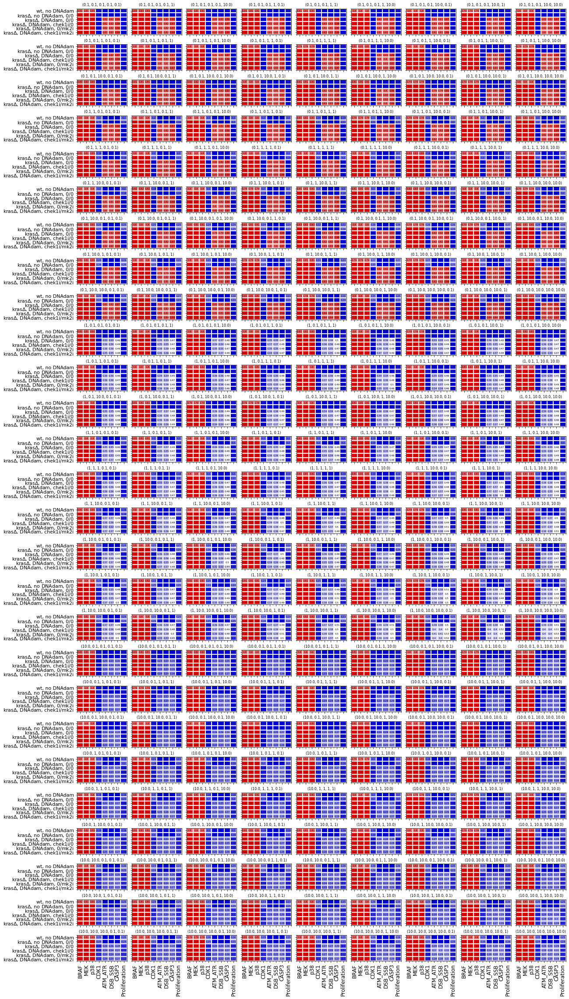

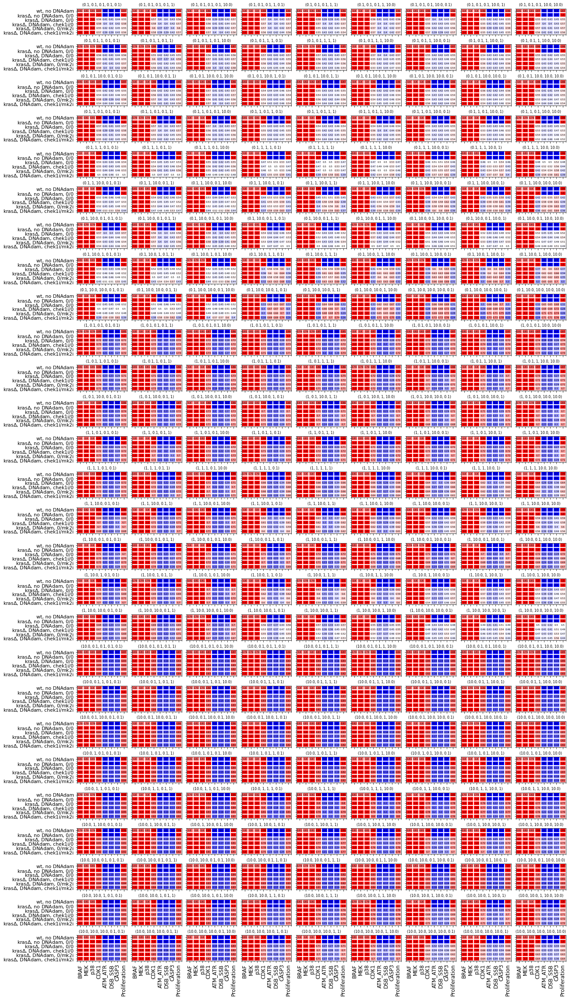

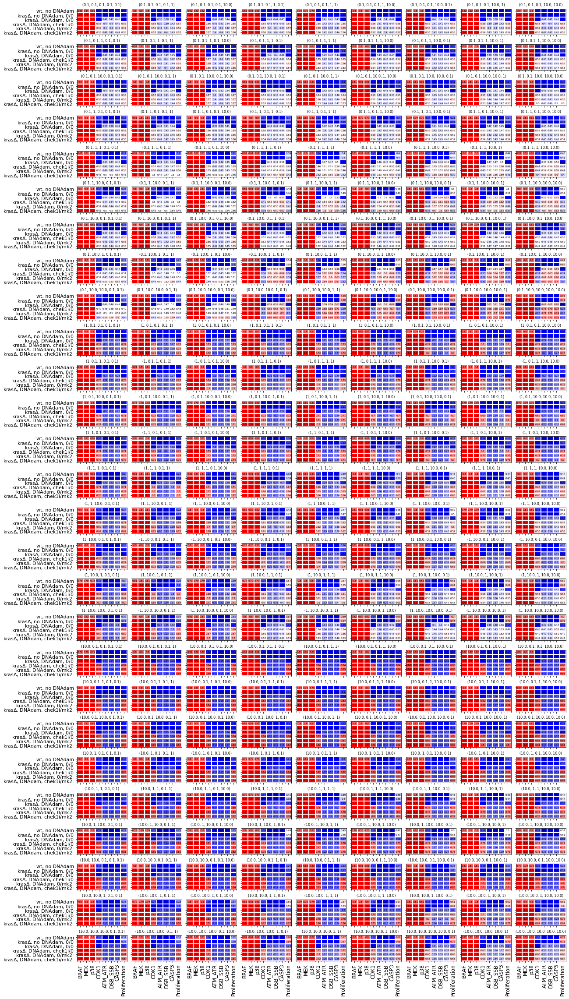

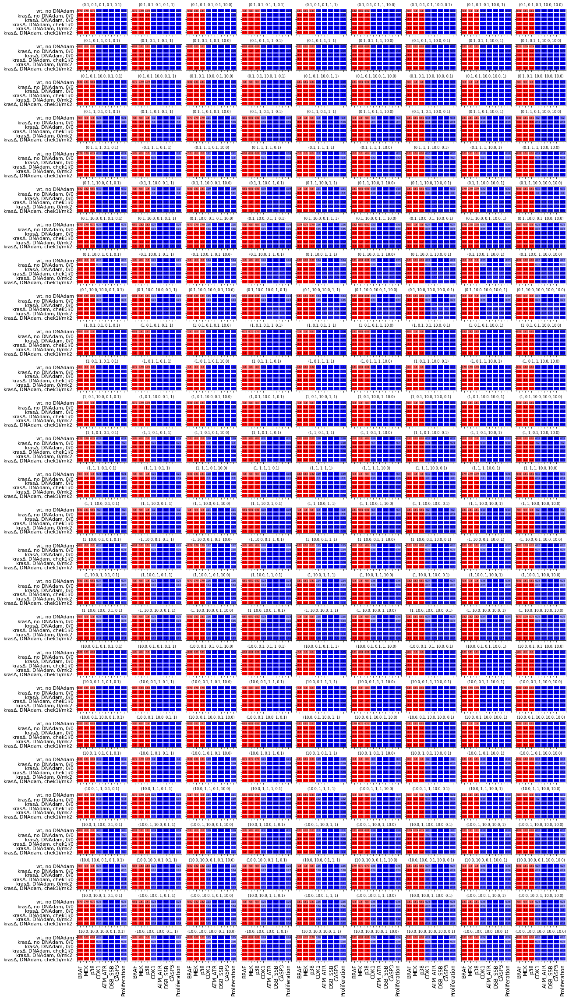

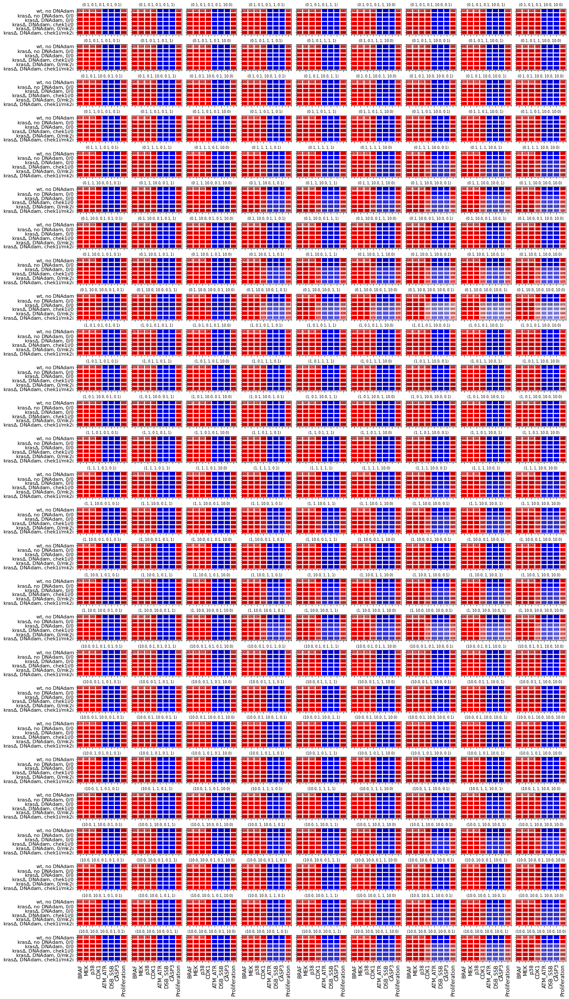

...

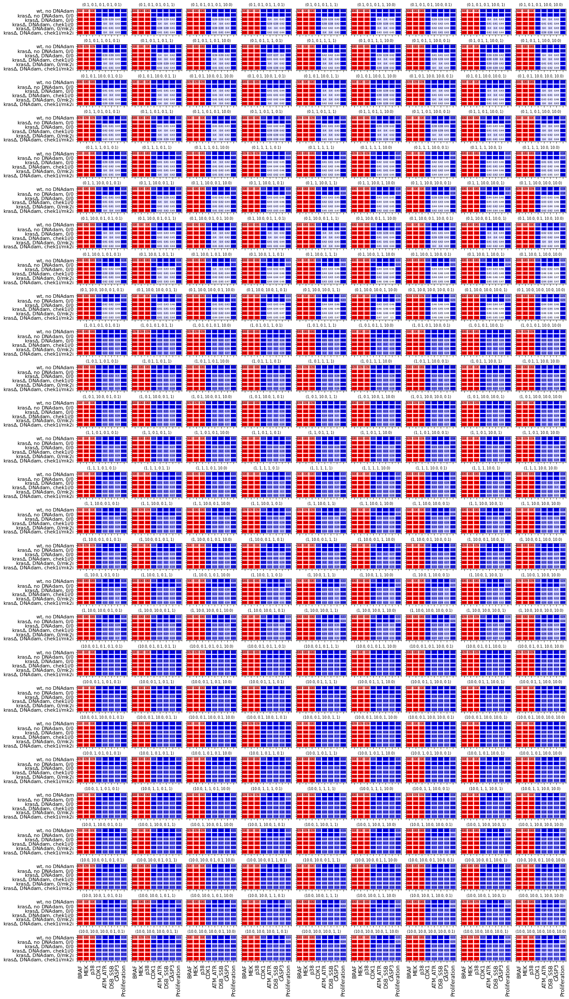

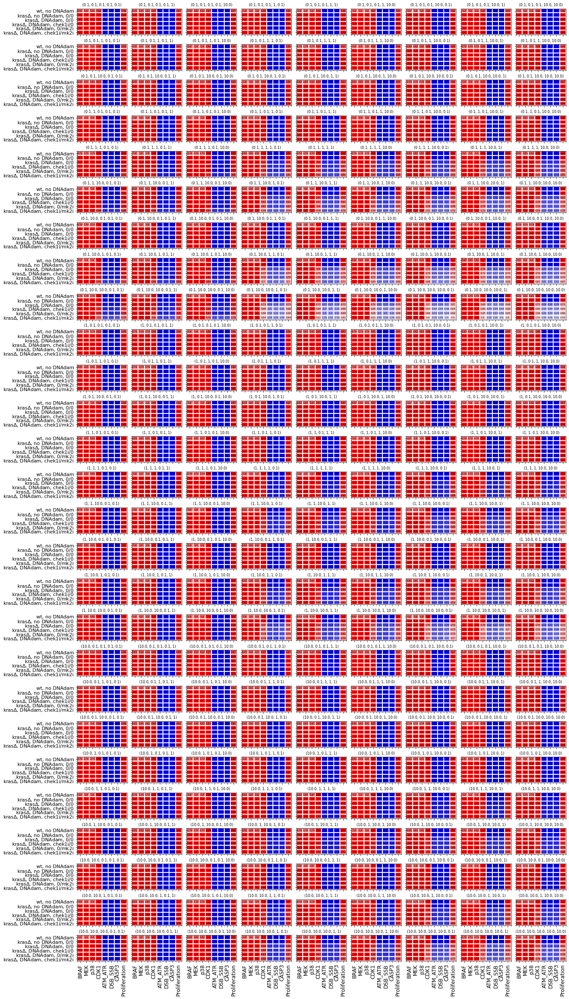

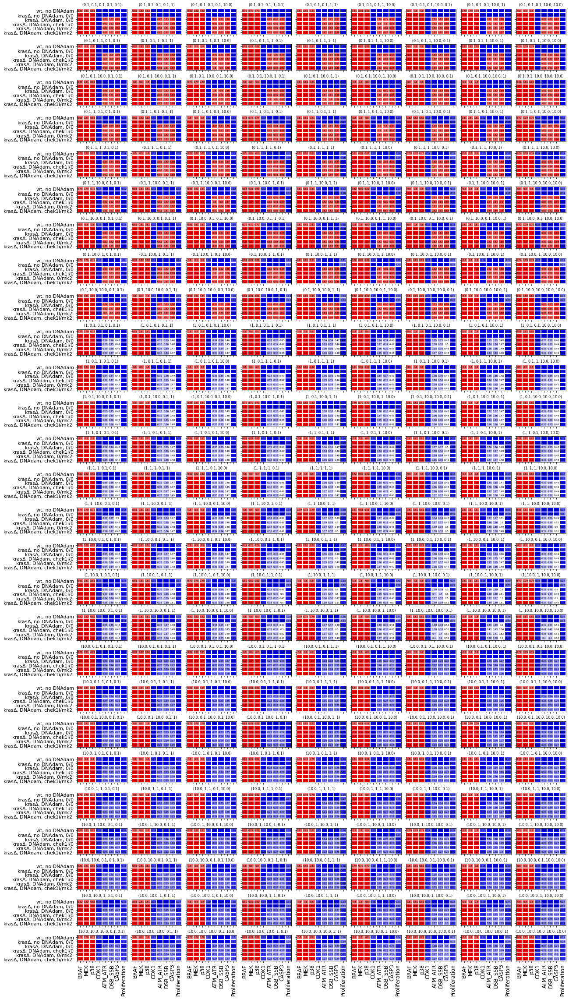

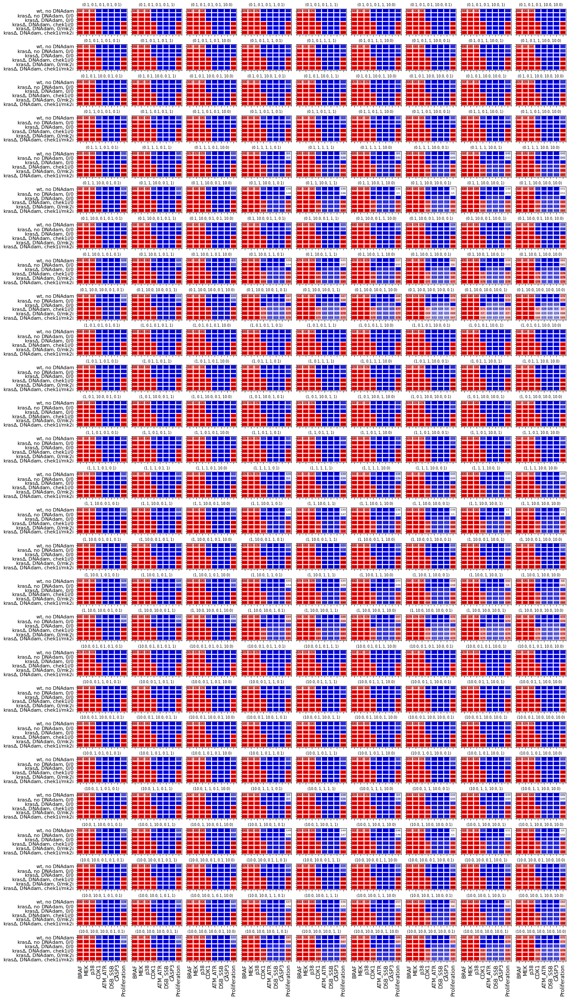

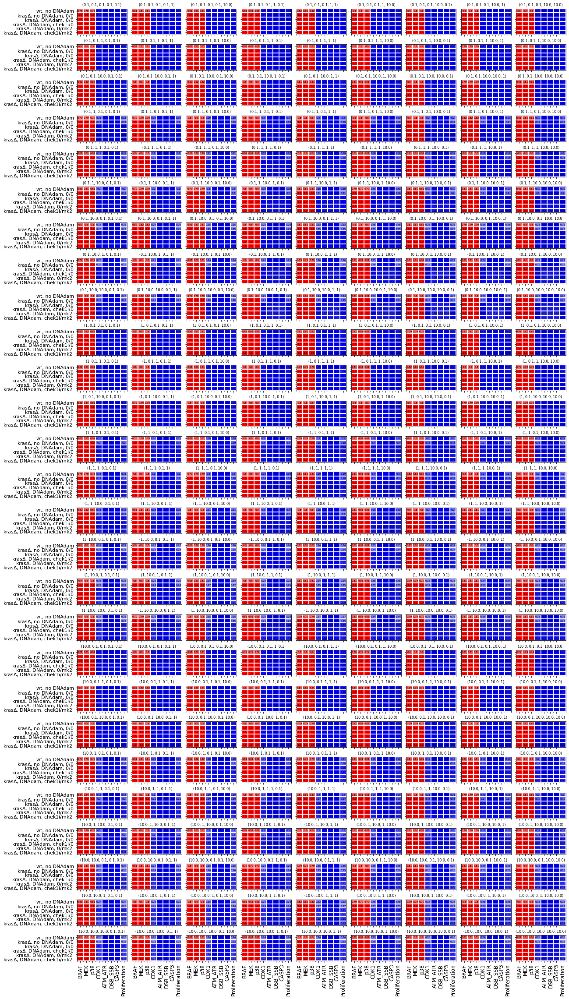

In [ ]:
cbar_padding=0.03; title_fonts=20; labelfntsz=12
from mpl_toolkits.axes_grid1 import make_axes_locatable
# fig.colorbar(pcm,ax=axs[0],fraction=0.045,pad=cbar_padding); plt.figure(figsize=(30,4))
colnum=int(9)
conds=pd_parscan_results_allmodels["conds"].unique()
sel_nodes=["BRAF","MEK","p38","CDK1","ATM_ATR","DSB_SSB","CASP3","Proliferation"]
subpl_dim=[int(np.ceil(len(parscan_results)/colnum)),colnum]
title_fonts=8 # cbar_padding=0.03; 
# fig.set_size_inches(20,20);  
modelnames=pd_parscan_results_allmodels["model"].unique()
for m in range(len(modelnames)):
    fig,axs=plt.subplots(subpl_dim[0],subpl_dim[1]) # gridspec_kw={'width_ratios':[1,1,1]}
    fig.set_size_inches(20,40); fig.subplots_adjust(wspace=0.1,hspace=0.38) # 
    for k in range(len(parscan_results)):
        # ax=fig.add_subplot(np.ceil(len(parscan_results)/colnum),colnum,k+1);
        ax=fig.add_subplot(axs[np.unravel_index([k],(subpl_dim[0],subpl_dim[1]))[0][0],\
                               np.unravel_index([k],(subpl_dim[0],subpl_dim[1]))[1][0]])
        truthvals=(pd_parscan_results_allmodels["parset"]==k)&\
            pd_parscan_results_allmodels["model"].str.contains(modelfiles[m])
        data=pd_parscan_results_allmodels[truthvals].iloc[:,3:][sel_nodes] # parscan_results[k][sel_nodes]
        
        pcm=ax.imshow(data.replace(np.nan,0),interpolation='none',cmap='bwr',vmin=0,vmax=1,aspect="auto")
        hmap_size=data.shape
        # ticks
        ax.set_xticks(np.arange(0,hmap_size[1],1)); ax.set_yticks(np.arange(0,hmap_size[0],1));
        # Minor ticks
        ax.set_xticks(np.arange(-0.5,hmap_size[1],1),minor=True);
        ax.set_yticks(np.arange(-0.5,hmap_size[0],1),minor=True)
        # Labels for major ticks
        ax.set_xticklabels([])
        if k>((axs.shape[0]-1)*colnum-1):ax.set_xticklabels(data.columns.values,rotation=90,fontsize=labelfntsz)
        if k % colnum==0: ax.set_yticklabels(barplot_titles,fontsize=11);
        else: ax.set_yticklabels([])
        # Gridlines based on minor ticks
        ax.grid(which='minor',color='w',linestyle='-',linewidth=2)
        # write values
        for (j,i),label in np.ndenumerate(data.replace(np.nan,0)):
            ax.text(i,j,np.round(label,2),ha='center',va='center',fontsize=5.5)
        # title
        ax.set_title(str(paramsets[k]),fontsize=title_fonts) # 
        # if k % colnum==2: plt.colorbar(pcm,ax=ax,fraction=0.045,pad=0.02) # pad=cbar_padding
    parscan_folder='figs/parscan_heatmaps/16models/'+parscan_str+"/"
    if not os.path.isdir(parscan_folder):
        os.mkdir(parscan_folder)
    plt.savefig(parscan_folder+modelnames[m]+'.pdf',bbox_inches='tight')

In [11]:
pd_parscan_results_allmodels.shape

(8748, 20)

# Model validation

In [60]:
modelnames=pd_parscan_results_allmodels["model"].unique()
# condition for Proliferation: cond6<cond4<cond5<cond3, cond2>cond1
params_str=['d_DSB_SSB','u_CDC25*','u_CDK1','u_Mitosis','u_CASP3']
conds_satisf=['prolif(kras$\Delta$)>prolif(wt)',
                        'prolif(kras$\Delta$)>prolif(chk1i)',\
                        'prolif(kras$\Delta$)>prolif(mk2i)',
                        'prolif(chk1i)<prolif(mk2i)',\
                        'prolif(kras$\Delta$)>prolif(chk1i,mk2i)',\
                        'prolif(chk1i)>prolif(chk1i,mk2i)']

pd_cond_truth_columns=np.hstack(['model',params_str,\
                       'prolif(kras$\Delta$)>prolif(wt)',
                        'prolif(kras$\Delta$)>prolif(chk1i)',\
                       'prolif(kras$\Delta$)>prolif(mk2i)',
                        'prolif(chk1i)<prolif(mk2i)',\
                        'prolif(kras$\Delta$)>prolif(chk1i,mk2i)',\
                                'prolif(chk1i)>prolif(chk1i,mk2i)'])
n_models=len(pd_parscan_results_allmodels['parset'].unique())
pd_cond_truth=pd.DataFrame(columns=pd_cond_truth_columns); cntr=-1
for k in range(len(modelnames)):
    for l in range(n_models):
        truthvals=(pd_parscan_results_allmodels["parset"]==l)&\
            pd_parscan_results_allmodels["model"].str.contains(modelfiles[k])
        data=np.round(pd_parscan_results_allmodels[truthvals],3).copy().reset_index(drop=True)
        # dnadam, chek1inhib, mk2inhib, doubleinhib
        prolif_score=np.hstack((k,[f for f in paramsets[l]],\
                    data['Proliferation'][2]>data['Proliferation'][1],\
                    data['Proliferation'][3]<data['Proliferation'][2],\
                    data['Proliferation'][4]<data['Proliferation'][2],\
                    data['Proliferation'][4]>data['Proliferation'][3],\
                    data['Proliferation'][5]<data['Proliferation'][2],\
                    data['Proliferation'][5]<data['Proliferation'][3] ))
        cntr=cntr+1; pd_cond_truth.loc[cntr]=prolif_score
        if (l==(n_models-1)): print(modelnames[k])
        # pd_parscan_results_allmodels[truthvals].iloc[:,3:][sel_nodes]

model1100.bnet
model1111.bnet
model0111.bnet
model1010.bnet
model1001.bnet
model0000.bnet
model0101.bnet
model0011.bnet
model1101.bnet
model0110.bnet
model1011.bnet
model0100.bnet
model0001.bnet
model1000.bnet
model0010.bnet
model1110.bnet


In [180]:
# indiv model
k=10; truthvals=(pd_parscan_results_allmodels["parset"]==l)&\
            pd_parscan_results_allmodels["model"].str.contains(modelfiles[k])
data=np.round(pd_parscan_results_allmodels[truthvals],3).copy().reset_index(drop=True)


['prolif(kras$\\Delta$)>prolif(wt)',
 'prolif(kras$\\Delta$)>prolif(chk1i)',
 'prolif(kras$\\Delta$)>prolif(mk2i)',
 'prolif(chk1i)<prolif(mk2i)',
 'prolif(kras$\\Delta$)>prolif(chk1i,mk2i)',
 'prolif(chk1i)>prolif(chk1i,mk2i)']

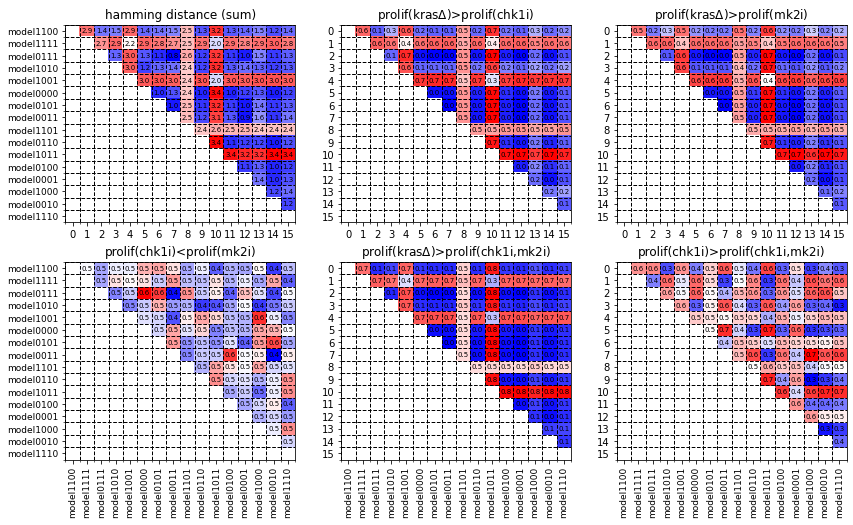

In [182]:
# Hamming distance
modelcombs=list(itertools.combinations(range(len(modelfiles)),2)); 
hmdist_matr=np.zeros([len(modelfiles),len(modelfiles)]); hmdist_matr[:]=np.nan
# for pair in modelcombs:
#     u=pd_cond_truth.loc[pd_cond_truth["model"]==pair[0],pd_cond_truth.columns.str.contains('prolif')]
#     v=pd_cond_truth.loc[pd_cond_truth["model"]==pair[1],pd_cond_truth.columns.str.contains('prolif')]
#     hmdists=[distance.hamming(u.iloc[:,k],v.iloc[:,k]) for k in range(u.shape[1])]
#     hmdist_matr[pair]=np.sum(hmdists)

nrow=2;ncol=3
fig,axs=plt.subplots(nrow,ncol); fig.set_size_inches(14,8)

for subpl_cntr in range(6):
    for pair in modelcombs:
        u=pd_cond_truth.loc[pd_cond_truth["model"]==pair[0],pd_cond_truth.columns.str.contains('prolif')]
        v=pd_cond_truth.loc[pd_cond_truth["model"]==pair[1],pd_cond_truth.columns.str.contains('prolif')]
        if subpl_cntr==0:
            hmdists=[distance.hamming(u.iloc[:,k],v.iloc[:,k]) for k in range(u.shape[1])]
            hmdist_matr[pair]=np.sum(hmdists); titlestr='hamming distance (sum)'
        else: 
            hmdist_matr[pair]=distance.hamming(u.iloc[:,subpl_cntr],v.iloc[:,subpl_cntr])
            titlestr=conds_satisf[subpl_cntr]
    # first subplot of hamming distance
    ax=axs[int(np.floor(subpl_cntr/ncol)),int(subpl_cntr-np.floor(subpl_cntr/ncol)*ncol)]; 
    ax.imshow(hmdist_matr,interpolation='none',cmap=cmapval,aspect="auto"); hmapd=hmdist_matr.shape; 
    # ticks (major, minor)
    ax.set_xticks(np.arange(0,hmapd[1],1)); ax.set_yticks(np.arange(0,hmapd[0],1));
    ax.set_xticks(np.arange(-0.5,hmapd[1],1),minor=True); ax.set_yticks(np.arange(-0.5,hmapd[0],1),minor=True)
    # Labels for major ticks
    trunc_modelnames=[x.replace('.bnet','') for x in modelfiles]
    if np.remainder(subpl_cntr,ncol)==0: ax.set_yticklabels(trunc_modelnames,fontsize=9); 
    if subpl_cntr>=ncol: ax.set_xticklabels(trunc_modelnames,rotation=90,fontsize=9); 
    # Gridlines based on minor ticks
    ax.grid(which='minor',color='black',linestyle='--',linewidth=1);ax.set_title(titlestr);
    for (j,i),label in np.ndenumerate(hmdist_matr):# .replace(np.nan,0)
        if not np.isnan(label): ax.text(i,j,np.round(label,1),ha='center',va='center',fontsize=7)
plt.savefig('hammer_distances_conds.pdf',bbox_inches='tight')

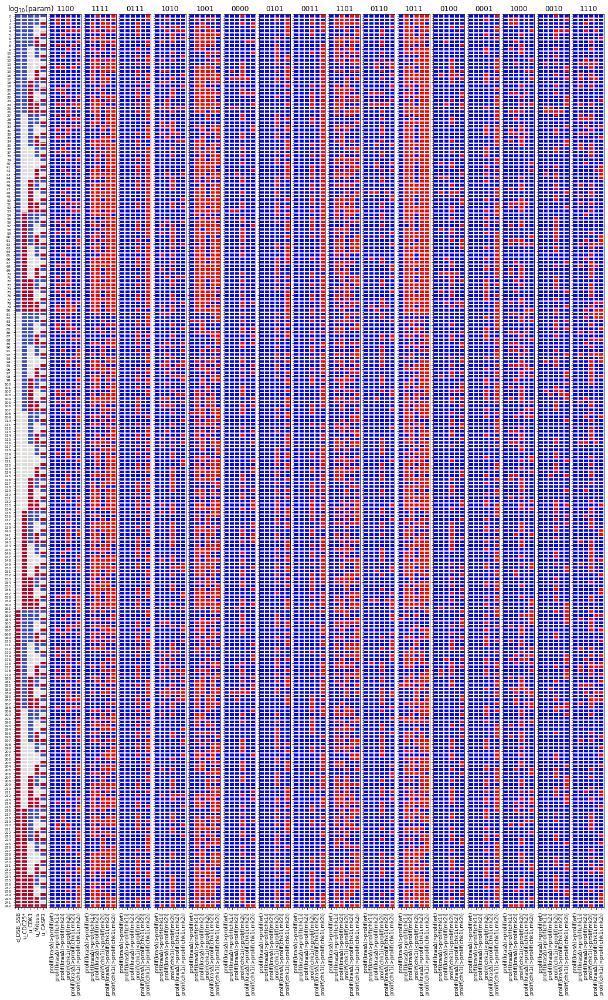

In [200]:
# fig=plt.figure(); fig.set_size_inches(10,10)
# plt.imshow(pd_cond_truth.iloc[:,4:],interpolation='none',cmap='bwr')
# pd_cond_truth
modelnames=pd_parscan_results_allmodels["model"].unique()

fig,axs=plt.subplots(1,len(modelnames)+1) # gridspec_kw={'width_ratios':[1,1,1]}
fig.set_size_inches(18,28); fig.subplots_adjust(wspace=0.12) # ,hspace=0.08 
for k in range(len(modelnames)+1): 
    ax=fig.add_subplot(axs[k]); col_lim=len(params_str)+1
    if k==0:
        dataplot=np.log10(pd_cond_truth.iloc[np.flatnonzero(pd_cond_truth["model"]==k),1:col_lim]); 
        cmapval='coolwarm'
    else:
        dataplot=pd_cond_truth.iloc[np.flatnonzero(pd_cond_truth["model"]==k-1),col_lim:].astype('bool'); 
        cmapval='bwr'
    # make heatmap
    pcm=ax.imshow(dataplot,interpolation='none',cmap=cmapval,aspect="auto"); hmapd=dataplot.shape 
    # ticks
    ax.set_xticks(np.arange(0,hmapd[1],1)); ax.set_yticks(np.arange(0,hmapd[0],1));
    # Minor ticks
    ax.set_xticks(np.arange(-0.5,hmapd[1],1),minor=True); ax.set_yticks(np.arange(-0.5,hmapd[0],1),minor=True)
    # Labels for major ticks
    ax.set_xticklabels(dataplot.columns.values,rotation=90,fontsize=9)
    # Gridlines based on minor ticks
    ax.grid(which='minor',color='w',linestyle='-',linewidth=2)
    # title
    if k>0: titlestr=[x.replace('.bnet','').replace('model','') for x in modelfiles][k-1]
    else: titlestr='log$_{10}$(param)'
    ax.set_title(titlestr)#,rotation=90
    if k==0: ax.set_yticklabels(range(len(paramsets)),fontsize=6)
    else: ax.set_yticklabels([])
parscan_str='16models/243parsets'
filename='figs/parscan_heatmaps/'+parscan_str+'/models_conds_satisf.pdf'
plt.savefig(filename,bbox_inches='tight')


## Performance across model versions

In [361]:
from math import pi
# 'A',np.sum(dataplot,axis=1)
index_str=[m.replace('.bnet','').replace('krasreduced_dnarep_','') for m in modelfiles]
prolifcolstart=np.flatnonzero(pd_cond_truth.columns.str.contains('prolif'))[0]
df_score=pd.DataFrame(index=index_str,columns=range(len(paramsets)))
np.flatnonzero(pd_cond_truth.columns.str.contains('prolif'))[0]
for k in range(len(modelfiles)):
    dataplot=pd_cond_truth.iloc[np.flatnonzero(pd_cond_truth["model"]==k),prolifcolstart:]; 
    df_score.iloc[k,:]=np.sum(dataplot,axis=1).values
df_score.reset_index(inplace=True); df_score.columns.values[0]='group'
df_score.sort_values(by=['group'],ascending=True,inplace=True)


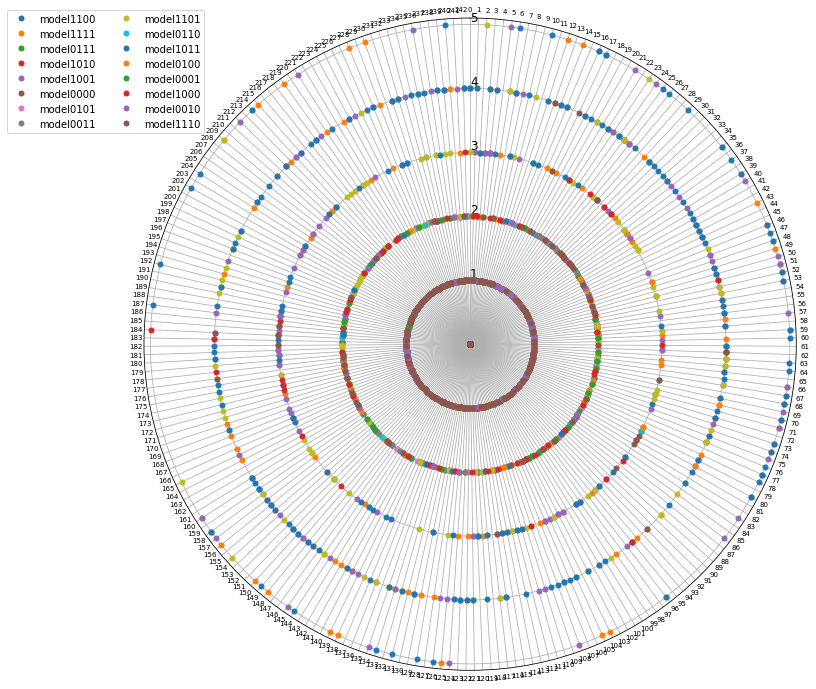

In [362]:
# Radar plot

N=len(paramsets) 
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N)*2*pi for n in range(N)]; angles += angles[:1]
# Initialise the spider plot
fig=plt.figure(); ax=plt.subplot(111, polar=True); fig.set_size_inches(12,12)
# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2); ax.set_theta_direction(-1)
# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], range(len(paramsets)),size=7,rotation=90); ax.tick_params(axis='x',pad=-2)
# Draw ylabels
ax.set_rlabel_position(0); plt.yticks([1,2,3,4,5], ["1","2","3","4",'5'],color="black",size=12); plt.ylim(0,5.1)

for k in range(len(modelfiles)):
    values=df_score.loc[k].drop('group').values.flatten().tolist()
    values+=values[:1]
    label_str=modelfiles[k].replace('.bnet','').replace('krasreduced_dnarep_','')
    ax.plot(angles, values,linestyle='',marker='o',markersize=5,label=label_str)
    # ax.fill(angles, values, 'b', alpha=0.1)
plt.legend(bbox_to_anchor=(0.1,1.02),ncol=2)
# plt.savefig('figs/parscan_heatmaps/'+parscan_str+'/modelscores_radarplot.pdf',bbox_inches='tight')

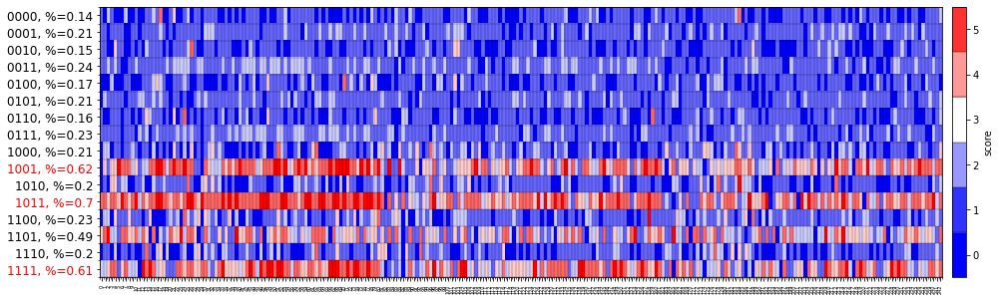

In [749]:
# ax.imshow(dataplot,interpolation='none',cmap=cmapval,aspect="auto")
df_score_float=df_score.iloc[:,1:].astype(float); hmapd=df_score_float.shape
modelversionscore=np.sum(df_score_float,axis=1)
fig,ax=plt.subplots(1,1); fig.set_size_inches(18,5)
# HEATMAP
pos=ax.imshow(df_score_float,interpolation='none',cmap='bwr',aspect="auto")
# ticks
ax.set_xticks(np.arange(0,hmapd[1],1)); ax.set_yticks(np.arange(0,hmapd[0],1));
# Minor ticks
ax.set_xticks(np.arange(-0.5,hmapd[1],1),minor=True); ax.set_yticks(np.arange(-0.5,hmapd[0],1),minor=True)
# Labels for major ticks
ax.set_xticklabels(range(hmapd[1]),rotation=90,fontsize=5)
relat_modvscore=np.round(modelversionscore/(5*243),2)
yticklabvals=[modelnames[df_score_float.index.values[x]].replace('.bnet','').replace('model','') +\
              ", %="+str(relat_modvscore.iloc[x]) for x in range(len(modelnames))]
ax.set_yticklabels(yticklabvals,fontsize=12);
# Gridlines based on minor ticks
ax.grid(which='minor',color='black',linestyle='-',linewidth=0.25)
for k in np.flatnonzero(relat_modvscore>0.5): plt.gca().get_yticklabels()[k].set_color('red')
cbar=fig.colorbar(pos,ax=ax,boundaries=np.arange(-1,6),\
                  ticks=np.arange(-1,6)+0.5,pad=0.01,label='score',drawedges=True)
cbar.ax.set_yticklabels(['0','1','2','3','4','5']);
saveflag=0
if saveflag:
    plt.savefig('figs/parscan_heatmaps/'+parscan_str+'/modelscores_sum.pdf',bbox_inches='tight')

### Hierarchical clustering


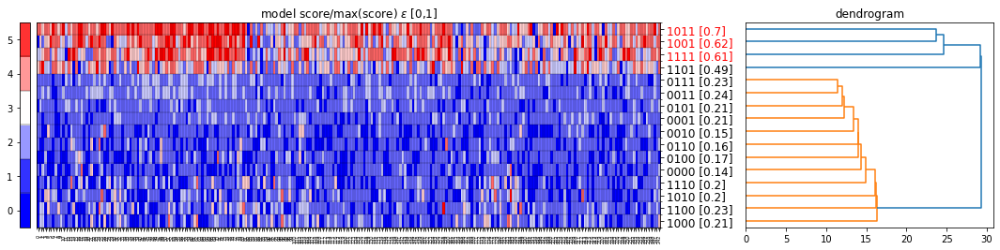

In [893]:
# hierarchical clustering
from scipy.cluster.hierarchy import dendrogram, linkage
binarnames=[x.replace('model','').replace('.bnet','') for x in modelnames_sorted]

fig,ax=plt.subplots(1,2,gridspec_kw={'width_ratios':[3,1]}); fig.set_size_inches(18,5); fig.tight_layout(pad=6)
# DENDROGRAM
X=df_score_float.copy(); X["name"]=binarnames; X=X.set_index('name'); linked=linkage(X,'single'); 
dendrplot=dendrogram(linked,orientation='right',distance_sort='descending',show_leaf_counts=True);
yticklabvals=[binarnames[x] for x in dendrplot['leaves']]; ax[1].set_title('dendrogram')
ax[1].set_yticklabels(''); # ax[1].set_xticklabels('');

# HEATMAP
pos=ax[0].imshow(df_score_float.iloc[np.flip(dendrplot['leaves']),:],interpolation='none',cmap='bwr',aspect="auto")
# ticks
ax[0].set_xticks(np.arange(0,hmapd[1],1)); ax[0].set_yticks(np.arange(0,hmapd[0],1));
# Minor ticks
ax[0].set_xticks(np.arange(-0.5,hmapd[1],1),minor=True); ax[0].set_yticks(np.arange(-0.5,hmapd[0],1),minor=True)
# Labels for major ticks
ax[0].set_xticklabels(range(hmapd[1]),rotation=90,fontsize=5)
relat_modvscore=np.round(modelversionscore/(5*len(paramsets)),2)
yticklabvals=[modelnames[df_score_float.index.values[x]].replace('.bnet','').replace('model','') +\
               " ["+str(relat_modvscore.iloc[x])+"]" for x in np.flip(dendrplot['leaves'])]
ax[0].yaxis.tick_right(); ax[0].set_yticklabels(yticklabvals,fontsize=12);
# # Gridlines based on minor ticks
ax[0].grid(which='minor',color='black',linestyle='-',linewidth=0.25)
for k in np.flatnonzero(relat_modvscore.iloc[np.flip(dendrplot['leaves'])]>0.5): \
    ax[0].get_yticklabels()[k].set_color('red')
ax[0].set_title(r'model score/max(score) $\epsilon$ [0,1]')
cbar=fig.colorbar(pos,ax=[ax[0]],boundaries=np.arange(-1,6),\
                  ticks=np.arange(-1,6)+0.5,pad=0.01,drawedges=True,location='left')
cbar.ax.set_yticklabels(['0','1','2','3','4','5']);

saveflag=1; filename='figs/parscan_heatmaps/'+parscan_str+'/modelscores_sum_dendrogram.pdf'
if saveflag: plt.savefig(filename,bbox_inches='tight')

In [848]:
# plt.rc('text', usetex=False); 

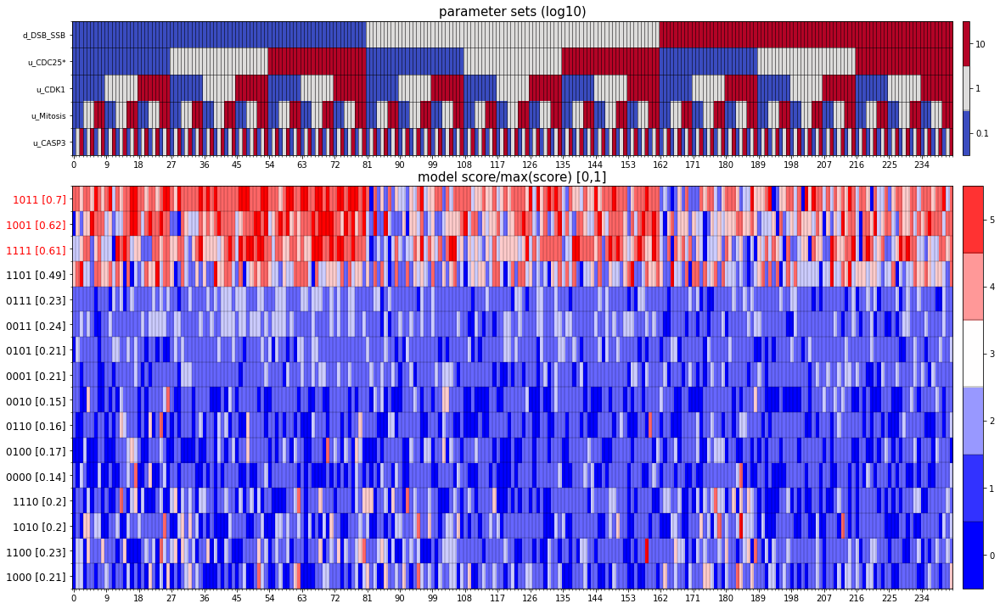

In [967]:
# PLOT: parameter sets and score heatmap

fig,ax=plt.subplots(2,1,gridspec_kw={'height_ratios':[1,3]}); fig.set_size_inches(18,10); fig.tight_layout(pad=1.5)

# HEATMAP of PARAMETER SETS
col_lim=len(params_str)+1; 
dataplot=np.log10(pd_cond_truth.iloc[np.flatnonzero(pd_cond_truth["model"]==k),1:col_lim]).transpose(); 
parheatmap=ax[0].imshow(dataplot,interpolation='none',cmap='coolwarm',aspect="auto")
# ticks
ax[0].set_xticks(np.arange(0,dataplot.shape[1],9)); ax[0].set_yticks(np.arange(0,dataplot.shape[0],1));
# Minor ticks
ax[0].set_xticks(np.arange(-0.5,dataplot.shape[1],1),minor=True); ax[0].set_yticks(np.arange(-0.5,dataplot.shape[0],1),minor=True)
# Labels for major ticks
ax[0].set_yticklabels(dataplot.index.values,fontsize=9)
# Gridlines based on minor ticks
ax[0].grid(which='minor',color='black',linestyle='-',linewidth=0.5);
ax[0].set_title('parameter sets (log10)',fontsize=15)
cbar=fig.colorbar(parheatmap,ax=[ax[0]],boundaries=np.arange(-1,len(np.unique(dataplot)))-0.5,\
                  ticks=np.arange(-1,len(np.unique(dataplot))),drawedges=True,pad=0.01,location='right')
cbar.ax.set_yticklabels(['0.1','1','10']);

# HEATMAP of MODEL SCORES
pos=ax[1].imshow(df_score_float.iloc[np.flip(dendrplot['leaves']),:],interpolation='none',cmap='bwr',aspect="auto")
# ticks
ax[1].set_xticks(np.arange(0,hmapd[1],9)); ax[1].set_yticks(np.arange(0,hmapd[0],1));
# Minor ticks
ax[1].set_xticks(np.arange(-0.5,hmapd[1],1),minor=True); ax[1].set_yticks(np.arange(-0.5,hmapd[0],1),minor=True)
# Labels for major ticks
# ax[1].set_xticklabels(np.arange(0,hmapd[1],9),rotation=90,fontsize=5)
relat_modvscore=np.round(modelversionscore/(5*len(paramsets)),2)
yticklabvals=[modelnames[df_score_float.index.values[x]].replace('.bnet','').replace('model','') +\
               " ["+str(relat_modvscore.iloc[x])+"]" for x in np.flip(dendrplot['leaves'])]
ax[1].set_yticklabels(yticklabvals,fontsize=12); # ax[1].yaxis.tick_right(); 
# # Gridlines based on minor ticks
ax[1].grid(which='minor',color='black',linestyle='-',linewidth=0.25)
for k in np.flatnonzero(relat_modvscore.iloc[np.flip(dendrplot['leaves'])]>0.5): \
    ax[1].get_yticklabels()[k].set_color('red')
ax[1].set_title(r'model score/max(score) [0,1]',fontsize=15)
cbar=fig.colorbar(pos,ax=[ax[1]],boundaries=np.arange(-1,6),\
                  ticks=np.arange(-1,6)+0.5,drawedges=True,pad=0.01,location='right') #,location='left',pad=0.01
cbar.ax.set_yticklabels(['0','1','2','3','4','5']);

saveflag=1; filename='figs/parscan_heatmaps/'+parscan_str+'/modelscores_sum_withparset.pdf'
if saveflag: plt.savefig(filename,bbox_inches='tight')

In [958]:
# range(hmapd[1])
np.arange(-1,len(np.unique(dataplot)))


array([-1.,  0.,  1.])

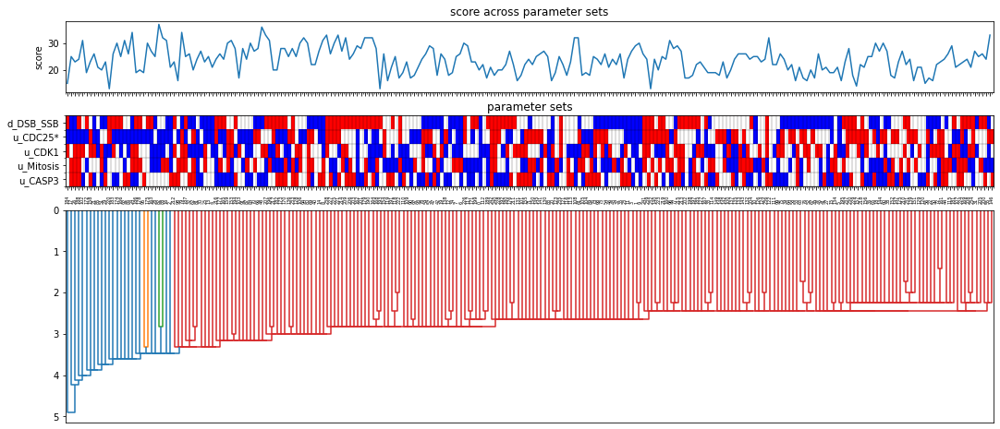

In [892]:
fig,ax=plt.subplots(3,1,gridspec_kw={'height_ratios':[1,1,3]}); fig.set_size_inches(18,8) # 

X_transp=X.transpose(); linked=linkage(X_transp,'single'); 
# fig,ax=plt.subplots(1); fig.set_size_inches(18,10)
dendrplotpar=dendrogram(linked,orientation='bottom',distance_sort='descending',show_leaf_counts=True)

parset_clust=pd.DataFrame([paramsets[x] for x in dendrplotpar["leaves"]]).transpose()

# score
ax[0].plot(np.sum(X_transp,axis=1)); ax[0].set_xlim([0,len(paramsets)])
# ticks
ax[0].set_xticks(np.arange(0,len(paramsets),1)); # ax[0].set_yticks(np.arange(0,len(params_str),1));
# Minor ticks
ax[0].set_xticks(np.arange(-0.5,len(paramsets),1),minor=True); ax[0].set_xticklabels(''); ax[0].set_ylabel('score')
ax[0].set_title('score across parameter sets')

# HEATMAP
pos=ax[1].imshow(np.log10(parset_clust),interpolation='none',cmap='bwr',aspect="auto")
ax[1].set_title('parameter sets')
# ticks
ax[1].set_xticks(np.arange(0,len(paramsets),1));ax[1].set_yticks(np.arange(0,len(params_str),1));
# Minor ticks
ax[1].set_xticks(np.arange(-0.5,len(paramsets),1),minor=True);ax[1].set_yticks(np.arange(-0.5,len(params_str),1),minor=True)
ax[1].set_xticklabels(''); ax[1].set_yticklabels(params_str);
ax[1].grid(which='minor',color='black',linestyle='-',linewidth=0.25)

saveflag=1
filename='figs/parscan_heatmaps/'+parscan_str+'/modelscores_sum_dendrogram_parsets.pdf'
if saveflag: plt.savefig(filename,bbox_inches='tight')

In [968]:
# decision tree learning


# Dynamics

In [544]:
# run model with a given parameter set

params_str_nested=['d_DSB_SSB', ['u_CDC25A', 'u_CDC25B_C'], 'u_CDK1', 'u_Mitosis']
mutation_nodes=[['RAS'],['RAS'],['RAS','CHEK1'],['RAS','CHEK1'],['RAS','CHEK1','MK2']]
mutation_vals=[['ON'],['ON'],['ON','OFF'],['ON','OFF'],['ON','OFF','OFF']]
initstate_nodes=[[],['DSB_SSB'],['DSB_SSB'],['DSB_SSB'],['DSB_SSB']]
initstate_vals=[[],[0,1],[0,1],[0,1],[0,1]]

filename="model_ens/old/krasreduced_dnarep_simplif_mitot_catast_chek1ATMATR_TP53mapk_cdcmekerk.bnet"
WT=maboss.loadBNet(filename)
WT.param["max_time"]=1e2; WT.param['time_tick']=0.5; WT.param['sample_count']=3e3
WT.network.set_istate('EGFR',[0,1]); WT.network.set_istate('DNArepair',[1,0])
WT.network.set_istate('DSB_SSB',[1,0]); WT.network.set_istate('RAS',[1,0])

outputs=fcn_multiple_experiments(WT,params_str_nested,paramsets,n_par,\
                               mutation_nodes,mutation_vals,initstate_nodes,initstate_vals)

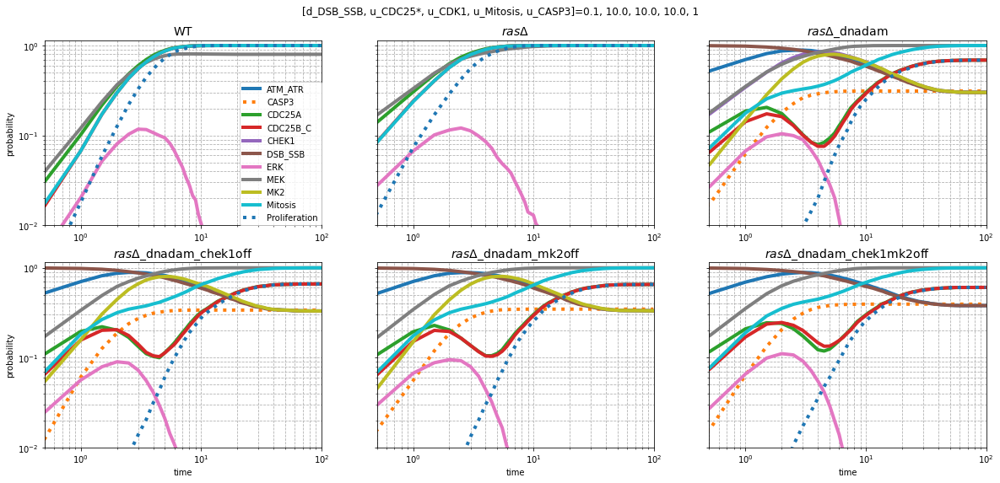

In [545]:
fig=plt.figure(); fig.set_size_inches(20,38);  
fig_pars=[4,8,6,'time', 'probability',50]
conds=['WT','$ras\Delta$','$ras\Delta$_dnadam','$ras\Delta$_dnadam_chek1off',\
       '$ras\Delta$_dnadam_mk2off','$ras\Delta$_dnadam_chek1mk2off']
nodes_string=['ATM_ATR','DSB_SSB','MEK','ERK','MK2','CHEK1','CDC','Mitosis','Proliferation','CASP3'] # 'p38',
for subpl_cntr in range(len(simul_results)):
    ax1=fig.add_subplot(8,len(conds)/2,subpl_cntr+1);
    maboss_results_object=outputs[subpl_cntr]
    nodes_probtraj_df=pd.DataFrame(maboss_results_object.get_nodes_probtraj())
    col_inds=nodes_probtraj_df.columns.str.contains('|'.join(nodes_string),case=False)
    nodes_probtraj_df=nodes_probtraj_df.loc[:,col_inds]
    for k in range(nodes_probtraj_df.shape[1]):
        varname=nodes_probtraj_df.columns[k]; lnst_val='-'
        if varname in ['Proliferation','CASP3']: lnst_val='dotted'
        ax1.plot(nodes_probtraj_df.iloc[:,k],linewidth=fig_pars[0],label=varname,linestyle=lnst_val) 
        if (subpl_cntr+1) % len(conds)==1: plt.legend(borderaxespad=0,loc='best') # ,ncol=2
    plt.xlim([0.5,1e2]); plt.ylim([0.01,1.15]); 
    plt.xscale('log'); plt.yscale('log'); plt.grid(True, which="both",linestyle='--'); 
    plt.title(conds[subpl_cntr],fontsize=14);
    if (subpl_cntr+1) % (len(conds)/2)==1: plt.ylabel(fig_pars[4]); 
    else: ax1.set_yticklabels([]);
    if subpl_cntr>(len(conds)/2-1): plt.xlabel(fig_pars[3]); 
    # if len(fig_pars)>5: plt.xlim(0,fig_pars[5])
pset=paramsets[n_par]
plt.suptitle('['+', '.join(params_str)+']='+', '.join([str(p) for p in pset]),y=0.895);
folder='figs/parscan_heatmaps/'
# plt.savefig(folder+parscan_str+'/dynamics_model'+str(n_mod)+'_parset'+str(n_par)+'.pdf',bbox_inches='tight')

In [549]:
n_par=79; n_model=4; filename='krasreduced_dnarep_simplif_mitot_catast_chek1ATMATR_TP53mapk_cdcmekerk.bnet'
truthvals=(pd_parscan_results_allmodels["parset"]==n_par)&\
  pd_parscan_results_allmodels["model"].str.contains(filename)

pd_parscan_results_allmodels.loc[truthvals,['conds','Proliferation','CASP3']]


,conds,Proliferation,CASP3


In [553]:
len(modelfiles)

16

# Individual simulations

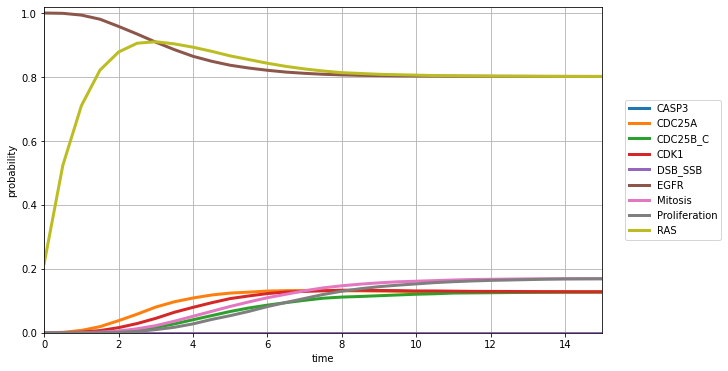

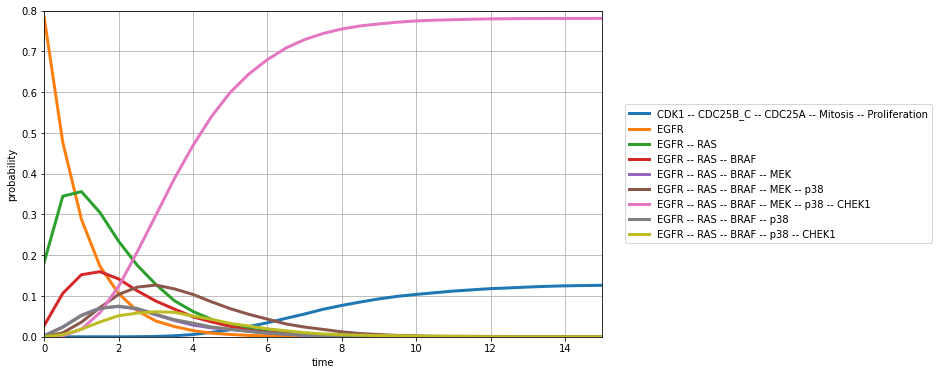

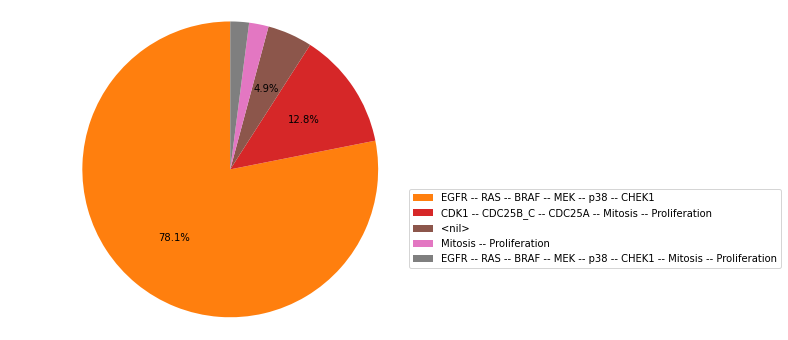

In [4]:
# plot node dynamics
# nodes_probtraj_df=pd.DataFrame(master_results.get_nodes_probtraj())
fig_pars=[3,10,6,"time","probability",15]; 
nodes_string=['EGFR','RAS','CDK1','CDC25A','CDC25B_C','DSB_SSB','Mitosis','Proliferation','CASP3']
plot_node_dynamics(run_WT_allinputs,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.02])

plot_states_larger_prob_x(run_WT_allinputs,0.05,[3,10,6,"time","probability",15]); plt.ylim([0,0.8]); plt.grid()

run_WT_allinputs.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);

### trajectories of states

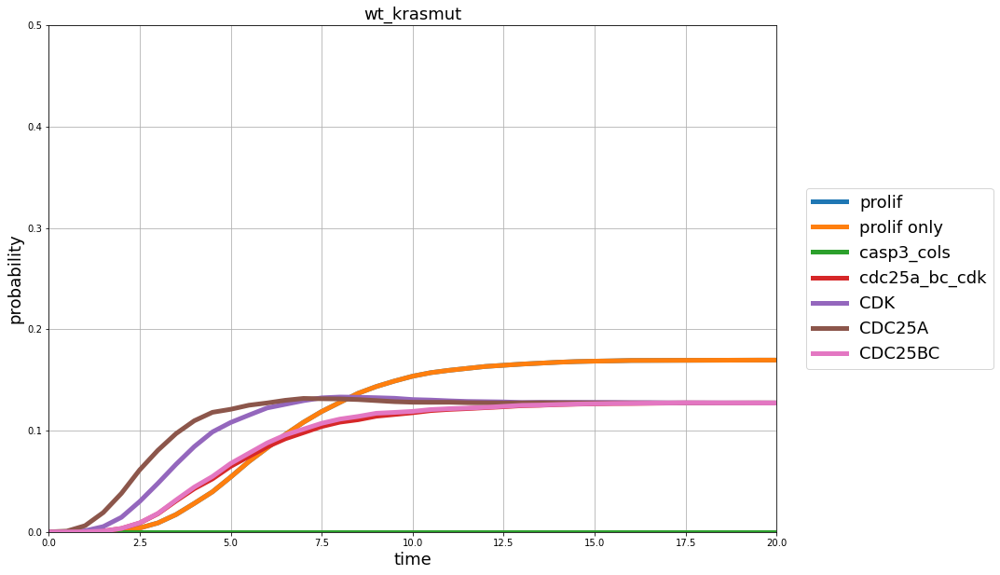

In [427]:
states_probtraj_wt=run_WT_allinputs.get_states_probtraj()
string_cellfates=["Prolif","CASP3","CDK","CDC25A","CDC25B"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_wt,string_cellfates)
[prolif_cols,casp3_cols,CDK_cols,CDC25A_cols,CDC25BC_cols]=cellfate_truthvals
list_truthval=[prolif_cols,prolif_cols&~casp3_cols,casp3_cols,CDK_cols&CDC25A_cols&CDC25BC_cols,\
               CDK_cols,CDC25A_cols,CDC25BC_cols]
list_labels=["prolif","prolif only","casp3_cols","cdc25a_bc_cdk","CDK","CDC25A","CDC25BC"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.5,20]; model_name='wt'
plot_cell_fates(states_probtraj_wt,model_name,str_plotname,plot_pars,list_truthval,list_labels,""); plt.grid()

## KRAS mutation

In [428]:
krasmut=maboss.copy_and_mutate(WT,["RAS"],"ON"); 
# mut_CHEKi = mut_BRAF_ON.copy(); mut_CHEKi.mutate("CHEK1", "OFF")
krasmut.get_initial_state()
krasmut_run=krasmut.run()

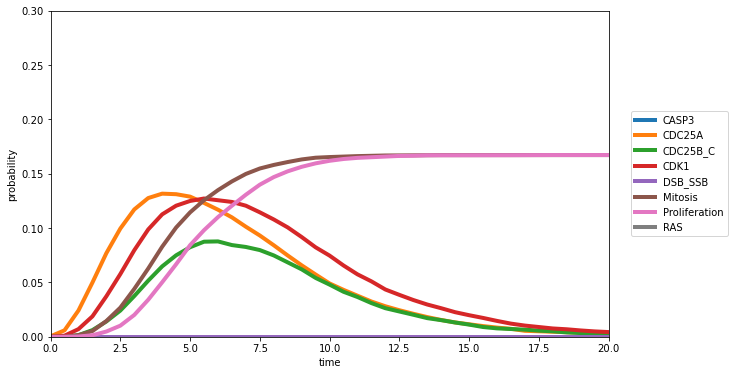

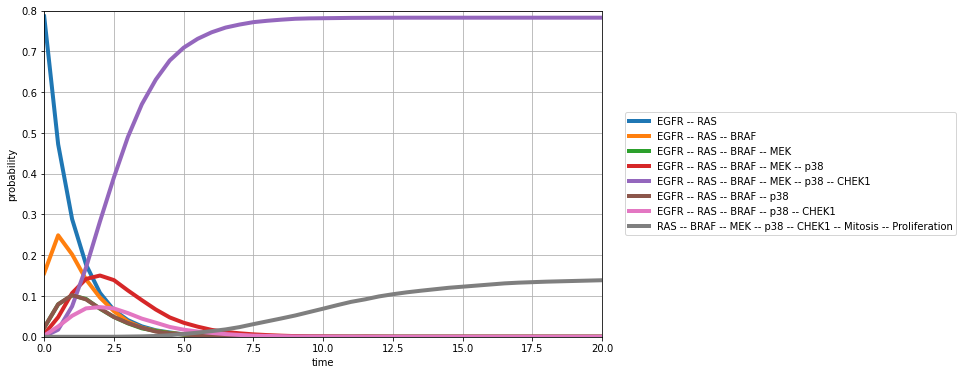

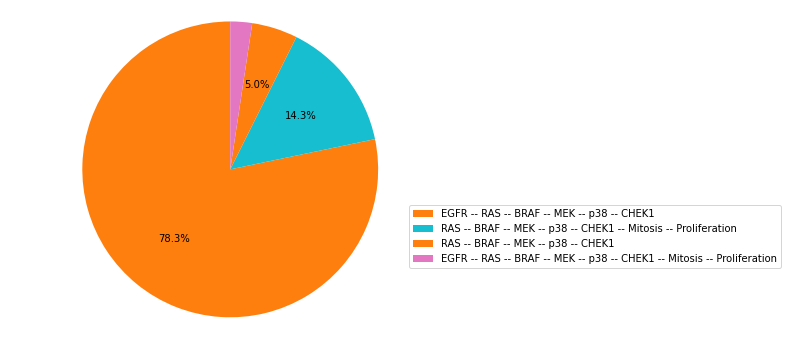

In [429]:
fig_pars=[4,10,6,"time","probability",20]; 
nodes_string=['CDK1','CDC25A','CDC25B_C','DSB_SSB','RAS','Mitosis','Proliferation','CASP3']
plot_node_dynamics(krasmut_run,nodes_string,fig_pars); plt.ylim([0,0.3])

plot_states_larger_prob_x(krasmut_run,0.05,[4,10,6,"time","probability",20]); plt.ylim([0,0.8]); plt.grid()

# plot_states_larger_prob_x(krasmut_run,0.05,[3,10,6,"time","probability",20])
krasmut_run.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);

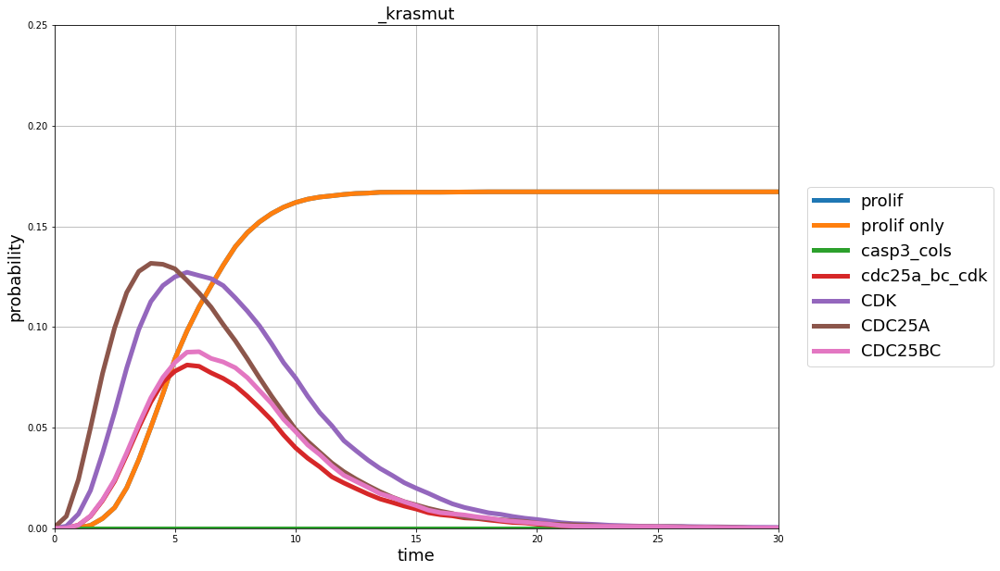

In [430]:
# krasmut_nodnadam_model=krasmut_run.copy() # maboss.copy_and_mutate(mutant_simulation, ["K_N_HRAS"], "ON")
# turn off DNA damage
# krasmut_nodnadam_model.network.set_istate("DSB_SSB",[1,0]);krasmut_nodnadam_results=krasmut_nodnadam_model.run()
states_probtraj_krasmut=krasmut_run.get_states_probtraj()

string_cellfates=["Prolif","CASP3","CDK","CDC25A","CDC25B"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_krasmut,string_cellfates)
[prolif_cols,casp3_cols,CDK_cols,CDC25A_cols,CDC25BC_cols]=cellfate_truthvals
list_truthval=[prolif_cols,prolif_cols&~casp3_cols,casp3_cols,CDK_cols&CDC25A_cols&CDC25BC_cols,\
               CDK_cols,CDC25A_cols,CDC25BC_cols]
list_labels=["prolif","prolif only","casp3_cols","cdc25a_bc_cdk","CDK","CDC25A","CDC25BC"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.25,30]; model_name=''
plot_cell_fates(states_probtraj_krasmut,model_name,str_plotname,plot_pars,list_truthval,list_labels,""); plt.grid()

# KRASmut+DNA damage

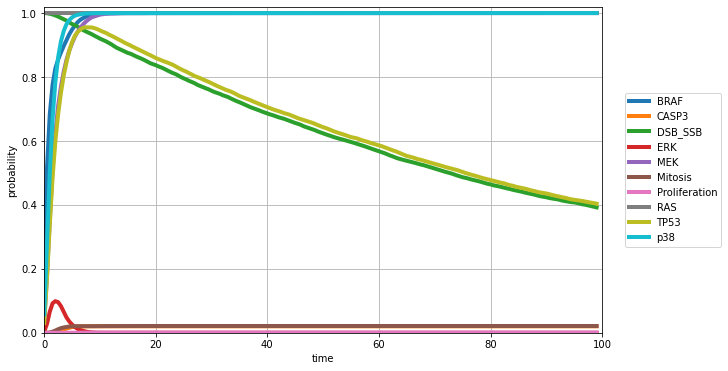

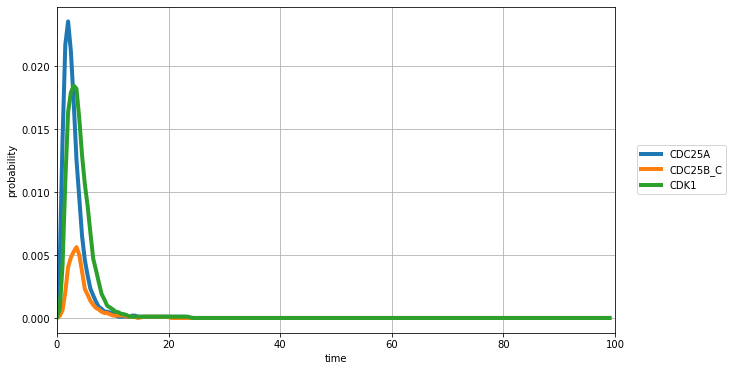

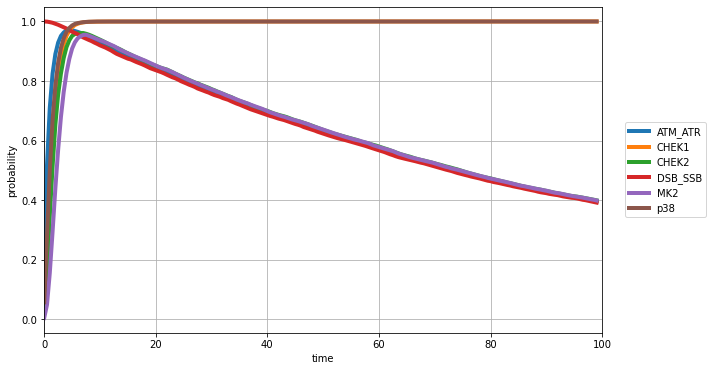

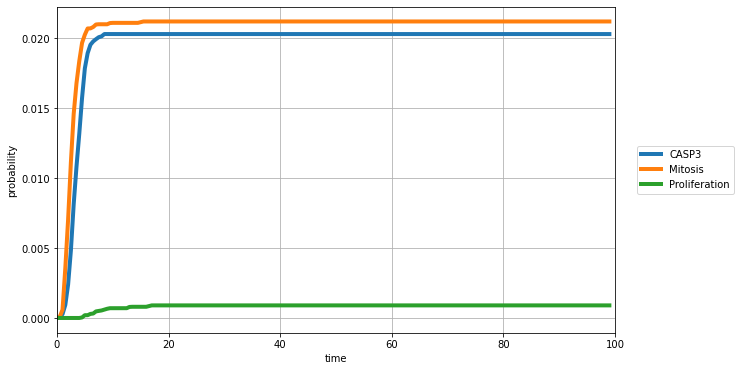

In [432]:
krasmut_dnadam=maboss.copy_and_mutate(WT, ["RAS"], "ON"); 
# krasmut_chek1off.mutate("CHEK1","OFF")
krasmut_dnadam.network.set_istate('DSB_SSB',[0,1])
krasmut_dnadam_run=krasmut_dnadam.run()
# krasmut_dnadam.get_initial_state()
fig_pars=[4,10,6,"time","probability",1e2]; 
nodes_string=['RAS','BRAF','MEK','ERK','p38','DSB_SSB','TP53','Mitosis','Proliferation','CASP3']
plot_node_dynamics(krasmut_dnadam_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.02])
plot_node_dynamics(krasmut_dnadam_run,['CDK1','CDC25A','CDC25B_C'],fig_pars); plt.grid()
plot_node_dynamics(krasmut_dnadam_run,['p38','CHEK1','CHEK2','MK2','ATM_ATR','DSB_SSB'],fig_pars); plt.grid()
plot_node_dynamics(krasmut_dnadam_run,['Mitosis','Proliferation','CASP3'],fig_pars); plt.grid()

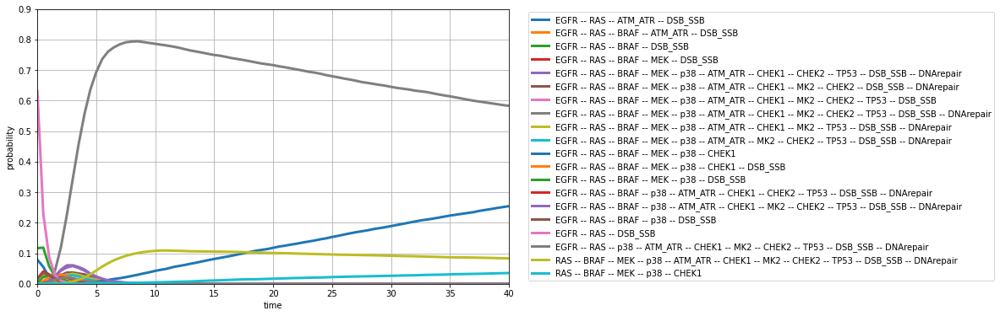

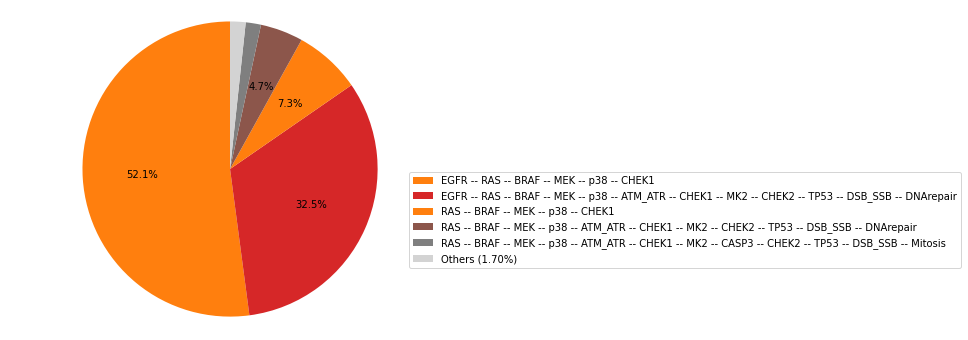

In [433]:
plot_states_larger_prob_x(krasmut_dnadam_run,0.02,[3,10,6,"time","probability",40])
plt.grid(); plt.ylim([0,0.9])
krasmut_dnadam_run.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);


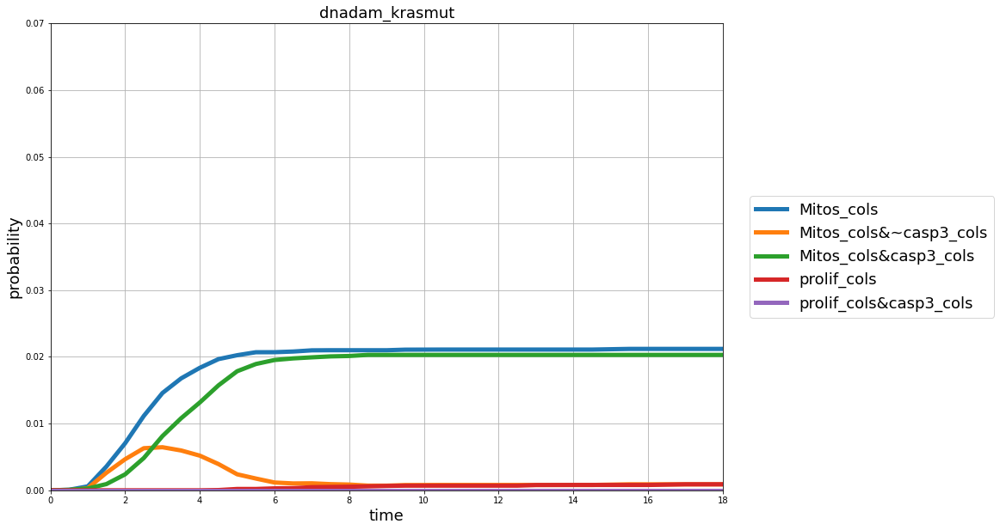

In [434]:
states_probtraj_krasmut_dnadam=krasmut_dnadam_run.get_states_probtraj()

string_cellfates=["Prolif","CASP3","DSB_SSB","Mitos"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_krasmut_dnadam,string_cellfates)
[prolif_cols,casp3_cols,dsb_ssb_cols,Mitos_cols]=cellfate_truthvals
list_truthval=[Mitos_cols,\
               Mitos_cols&~casp3_cols,\
               Mitos_cols&casp3_cols,\
              prolif_cols,\
              prolif_cols&casp3_cols]
list_labels=["Mitos_cols",\
             "Mitos_cols&~casp3_cols",\
             "Mitos_cols&casp3_cols",\
            "prolif_cols",\
            "prolif_cols&casp3_cols"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.07,18]; model_name='dnadam'
plot_cell_fates(states_probtraj_krasmut_dnadam,model_name,str_plotname,plot_pars,list_truthval,list_labels,"")
plt.grid()

In [435]:
np.sum(states_probtraj_krasmut_dnadam.iloc[-1,casp3_cols])


0.0203

# KRASMUT + DNADAM + CHEK1off

(0.0, 1.02)

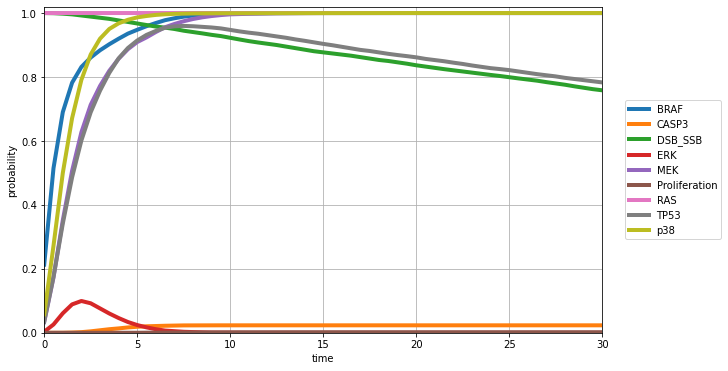

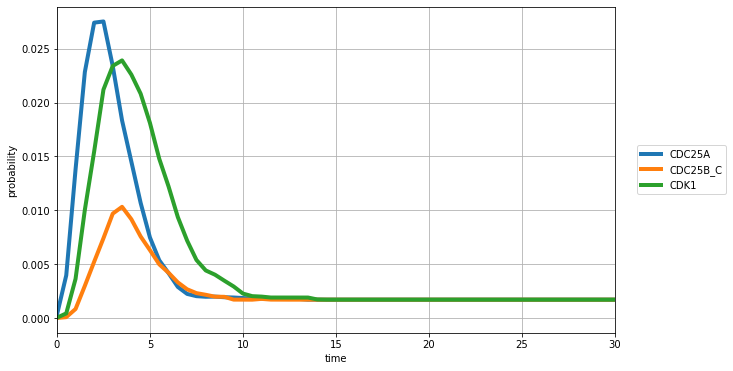

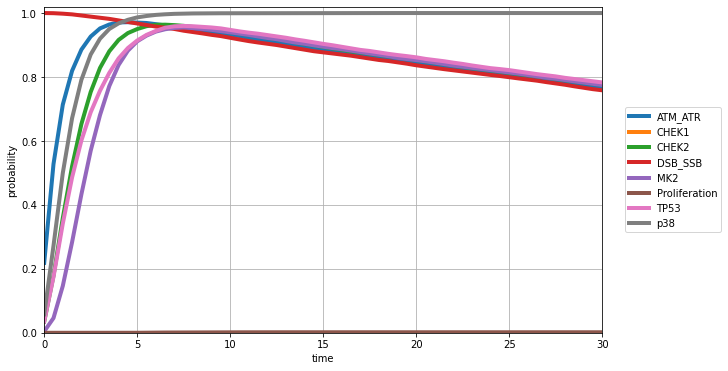

In [436]:
krasmut_dnadam_chek1off=maboss.copy_and_mutate(WT,["RAS"],"ON"); krasmut_dnadam_chek1off.mutate("CHEK1","OFF")
krasmut_dnadam_chek1off.network.set_istate('DSB_SSB',[0,1]);krasmut_dnadam_chek1off.network.set_istate('RAS',[0,1])
krasmut_dnadam_chek1off_run=krasmut_dnadam_chek1off.run()

fig_pars=[4,10,6,"time","probability",30]; 
# nodes_string=['CDK1','CDC25A','CDC25B_C','DSB_SSB','RAS','Proliferation','CASP3']
# plot_node_dynamics(krasmut_dnadam_chek1off_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.01])
nodes_string=['RAS','BRAF','MEK','ERK','p38','DSB_SSB','TP53','Proliferation','CASP3']
plot_node_dynamics(krasmut_dnadam_chek1off_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.02])
plot_node_dynamics(krasmut_dnadam_chek1off_run,['CDK1','CDC25A','CDC25B_C'],fig_pars); plt.grid()
plot_node_dynamics(krasmut_dnadam_chek1off_run,['p38','CHEK1','CHEK2','MK2','ATM_ATR',\
                          'TP53','DSB_SSB','Proliferation'],fig_pars); plt.grid(); plt.ylim([0,1.02])

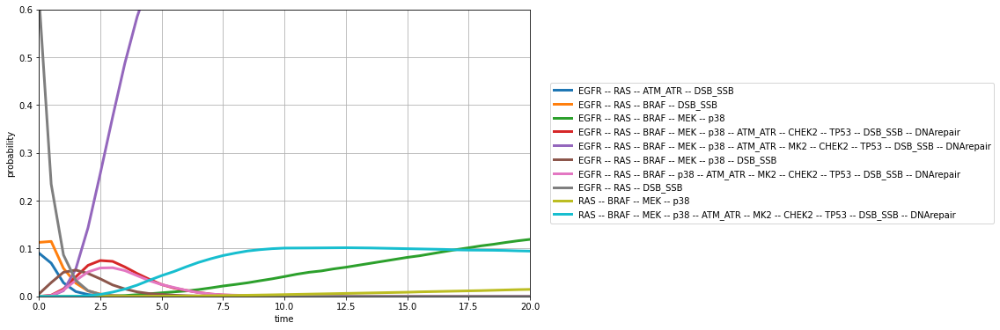

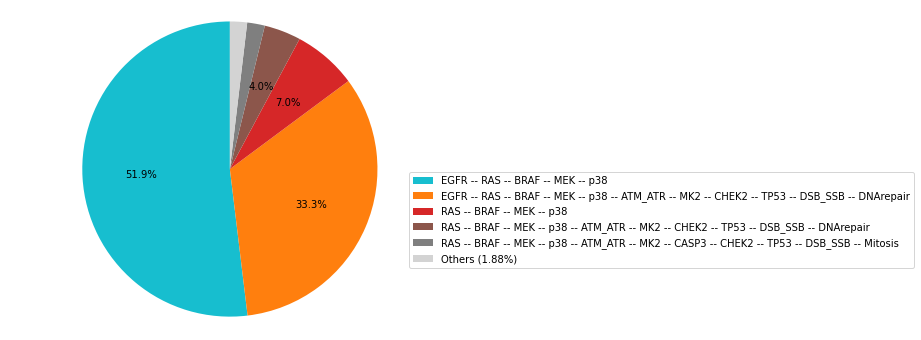

In [437]:
plot_states_larger_prob_x(krasmut_dnadam_chek1off_run,0.05,[3,10,6,"time","probability",20])
plt.grid(); plt.ylim([0,0.6])
krasmut_dnadam_chek1off_run.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);


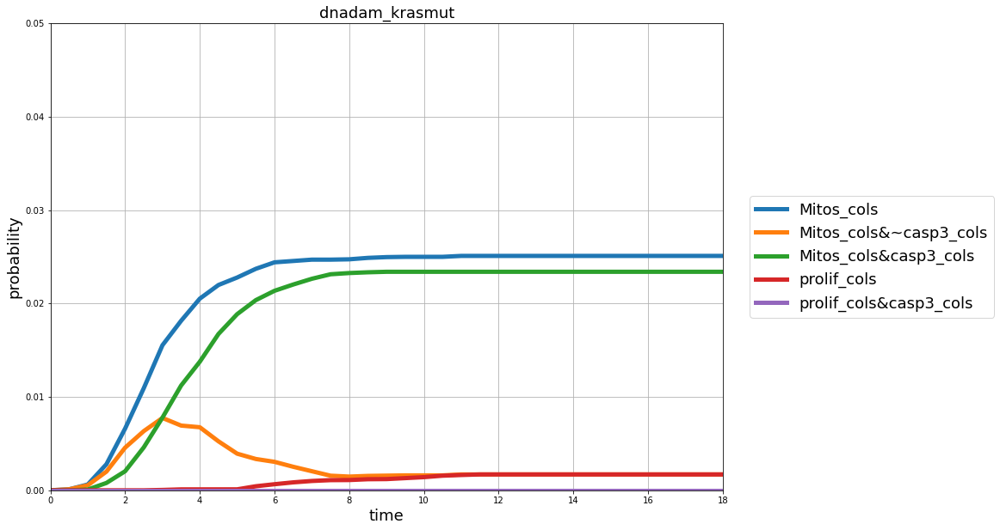

In [438]:
states_probtraj_krasmut_dnadam_chek1off=krasmut_dnadam_chek1off_run.get_states_probtraj()

string_cellfates=["Prolif","CASP3","Mitosis","TP53"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_krasmut_dnadam_chek1off,string_cellfates)
[prolif_cols,casp3_cols,Mitos_cols,tp53_cols]=cellfate_truthvals
list_truthval=[Mitos_cols,\
               Mitos_cols&~casp3_cols,\
               Mitos_cols&casp3_cols,\
              prolif_cols,\
              prolif_cols&casp3_cols]
list_labels=["Mitos_cols",\
              "Mitos_cols&~casp3_cols",\
              "Mitos_cols&casp3_cols",\
              "prolif_cols",\
              "prolif_cols&casp3_cols"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.05,18]; model_name='dnadam'
plot_cell_fates(states_probtraj_krasmut_dnadam_chek1off,model_name,\
                str_plotname,plot_pars,list_truthval,list_labels,"")
plt.grid()

In [439]:
np.sum(states_probtraj_krasmut_dnadam_chek1off.iloc[-1,casp3_cols])

0.0234

# KRASMUT + DNADAM + MK2off

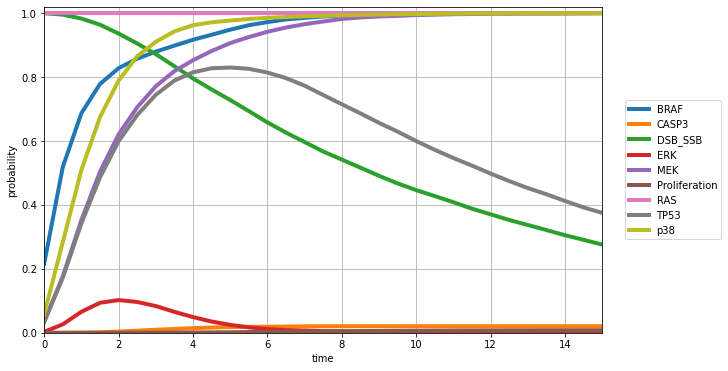

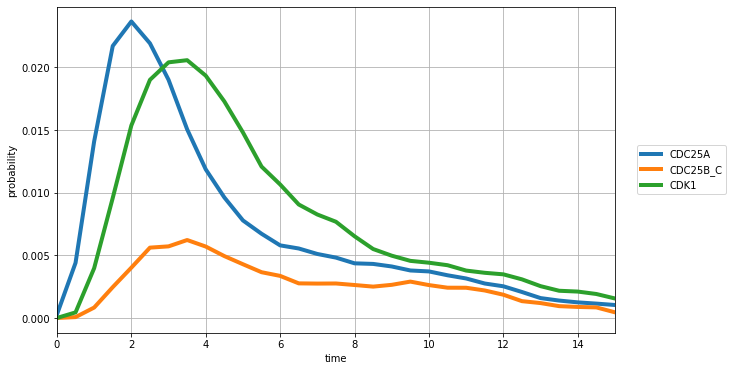

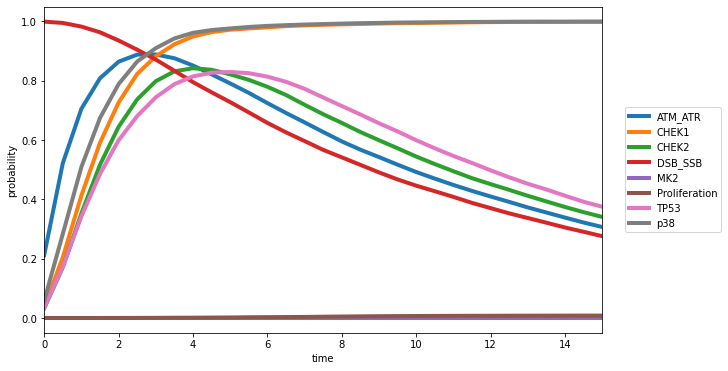

In [385]:
krasmut_dnadam_mk2off=maboss.copy_and_mutate(WT,["RAS"],"ON"); krasmut_dnadam_mk2off.mutate("MK2","OFF")
krasmut_dnadam_mk2off.network.set_istate('DSB_SSB',[0,1]);krasmut_dnadam_mk2off.network.set_istate('RAS',[0,1])
krasmut_dnadam_mk2off_run=krasmut_dnadam_mk2off.run()

fig_pars=[4,10,6,"time","probability",15]; 
# nodes_string=['CDK1','CDC25A','CDC25B_C','DSB_SSB','RAS','Proliferation','CASP3']
# plot_node_dynamics(krasmut_dnadam_mk2off_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.01])
nodes_string=['RAS','BRAF','MEK','ERK','p38','DSB_SSB','TP53','Proliferation','CASP3']
plot_node_dynamics(krasmut_dnadam_mk2off_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.02])
plot_node_dynamics(krasmut_dnadam_mk2off_run,['CDK1','CDC25A','CDC25B_C'],fig_pars); plt.grid()
plot_node_dynamics(krasmut_dnadam_mk2off_run,['p38','CHEK1','CHEK2','MK2','ATM_ATR',\
                                                'TP53','DSB_SSB','Proliferation'],fig_pars); 

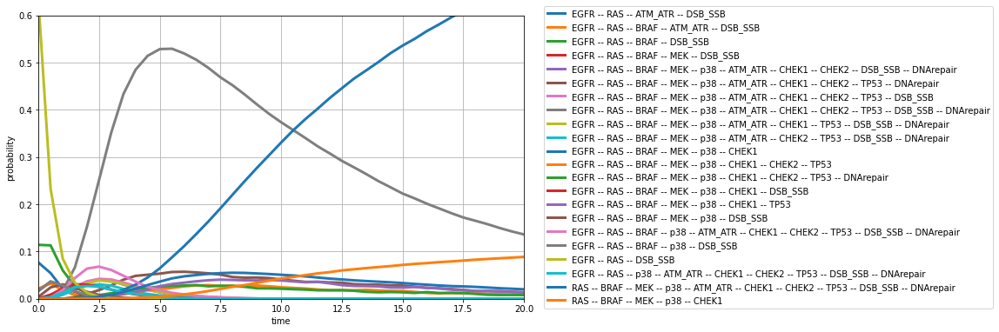

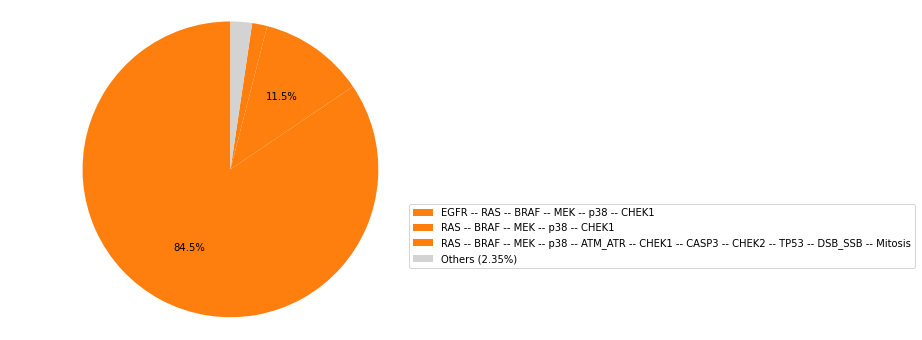

In [386]:
plot_states_larger_prob_x(krasmut_dnadam_mk2off_run,0.025,[3,10,6,"time","probability",20])
plt.grid(); plt.ylim([0,0.6])
krasmut_dnadam_mk2off_run.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);


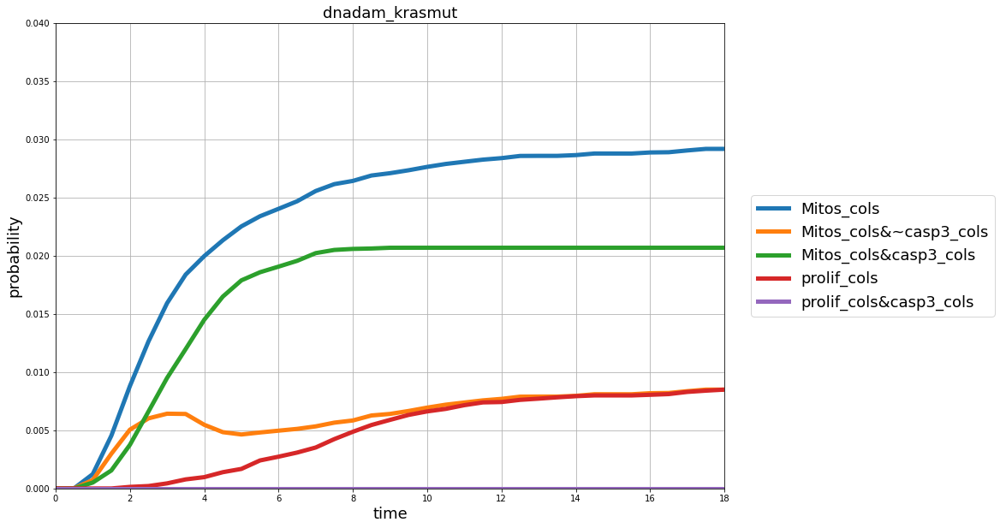

In [389]:
states_probtraj_krasmut_dnadam_mk2off=krasmut_dnadam_mk2off_run.get_states_probtraj()

string_cellfates=["Prolif","CASP3","Mitosis","TP53"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_krasmut_dnadam_mk2off,string_cellfates)
[prolif_cols,casp3_cols,Mitos_cols,tp53_cols]=cellfate_truthvals
list_truthval=[Mitos_cols,\
               Mitos_cols&~casp3_cols,\
               Mitos_cols&casp3_cols,\
              prolif_cols,\
              prolif_cols&casp3_cols]
list_labels=["Mitos_cols",\
               "Mitos_cols&~casp3_cols",\
               "Mitos_cols&casp3_cols",\
              "prolif_cols",\
              "prolif_cols&casp3_cols"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.04,18]; model_name='dnadam'
plot_cell_fates(states_probtraj_krasmut_dnadam_mk2off,model_name,\
                str_plotname,plot_pars,list_truthval,list_labels,"")
plt.grid()

# prolif_cols,\
#             prolif_cols&~casp3_cols,\
#              casp3_cols,\
#               casp3_cols&prolif_cols,\
#               dsb_ssb_cols&prolif_cols,\
#               ~dsb_ssb_cols&tp53_cols&casp3_cols,\
#              dsb_ssb_cols&tp53_cols&casp3_cols,\
#              dsb_ssb_cols&~tp53_cols&casp3_cols

In [390]:
np.sum(states_probtraj_krasmut_dnadam_mk2off.iloc[-1,casp3_cols])

0.020700000000000003

# KRASMUT + DNADAM + CHEK1off + MK2off

(0.0, 1.02)

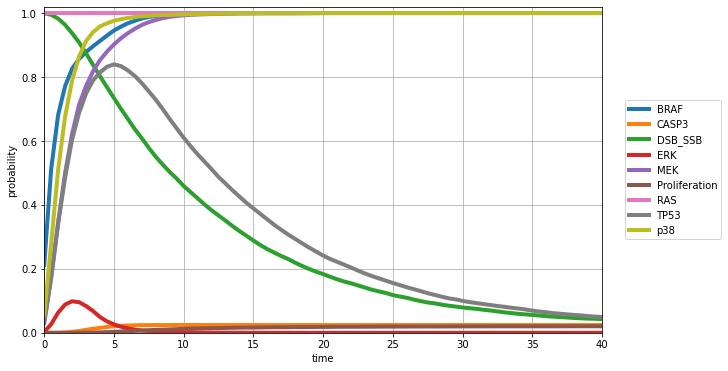

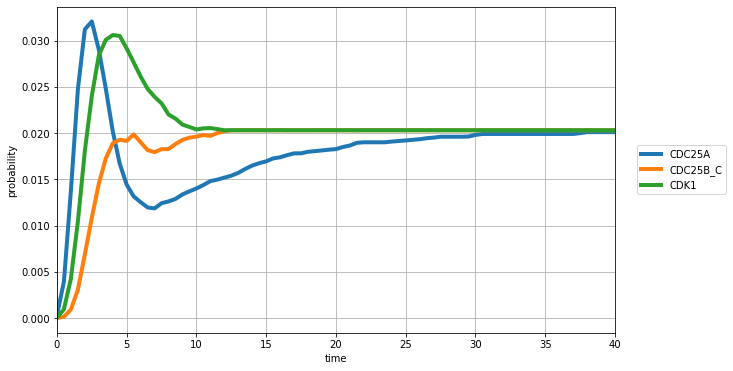

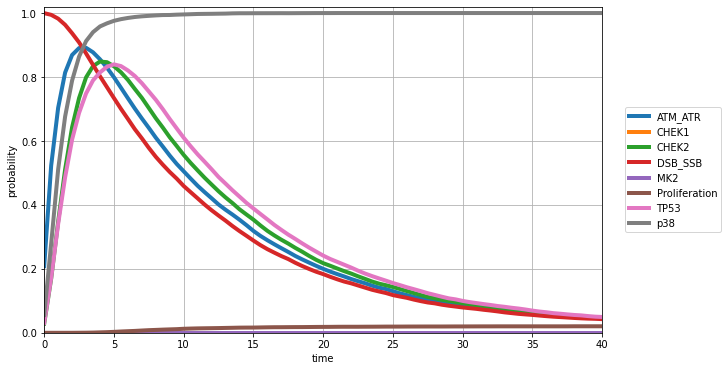

In [391]:
krasmut_dnadam_chek1mk2off=maboss.copy_and_mutate(WT, ["RAS"], "ON"); 
krasmut_dnadam_chek1mk2off.mutate("MK2","OFF"); krasmut_dnadam_chek1mk2off.mutate("CHEK1","OFF")
krasmut_dnadam_chek1mk2off.network.set_istate('DSB_SSB',[0,1]);
krasmut_dnadam_chek1mk2off.network.set_istate('RAS',[0,1])
krasmut_dnadam_chek1mk2off_run=krasmut_dnadam_chek1mk2off.run()

fig_pars=[4,10,6,"time","probability",40]; 
nodes_string=['RAS','BRAF','MEK','ERK','p38','DSB_SSB','TP53','Proliferation','CASP3']
# krasmut_dnadam_chek1mk2off.get_mutations()
# krasmut_dnadam_chek1mk2off.get_initial_state()
plot_node_dynamics(krasmut_dnadam_chek1mk2off_run,nodes_string,fig_pars); plt.grid(); plt.ylim([0,1.02])
plot_node_dynamics(krasmut_dnadam_chek1mk2off_run,['CDK1','CDC25A','CDC25B_C'],fig_pars); plt.grid()
plot_node_dynamics(krasmut_dnadam_chek1mk2off_run,['p38','CHEK1','CHEK2','MK2','ATM_ATR',\
                               'TP53','DSB_SSB','Proliferation'],fig_pars); plt.grid(); plt.ylim([0,1.02])

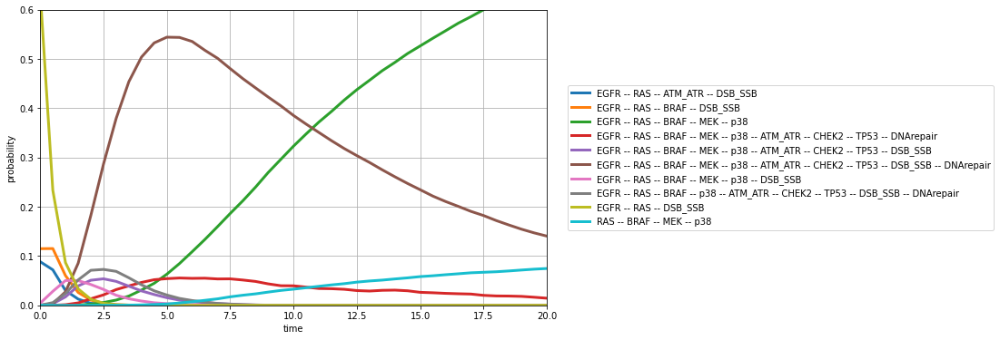

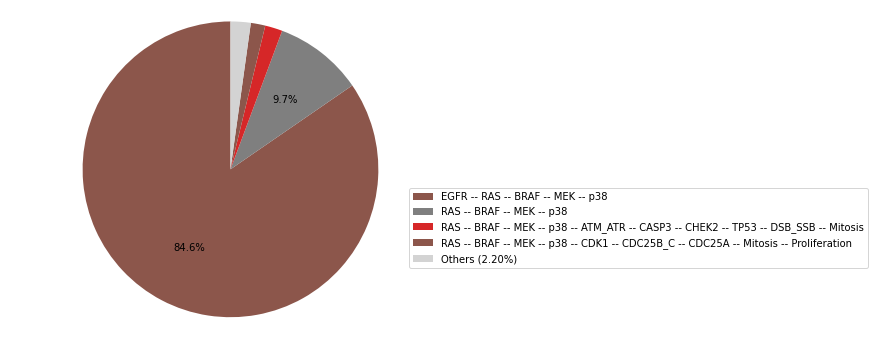

In [392]:
plot_states_larger_prob_x(krasmut_dnadam_chek1mk2off_run,0.05,[3,10,6,"time","probability",20])
plt.grid(); plt.ylim([0,0.6])
krasmut_dnadam_chek1mk2off_run.plot_piechart(); fig_state_piechart=plt.gcf(); fig_state_piechart.set_size_inches(8,6);


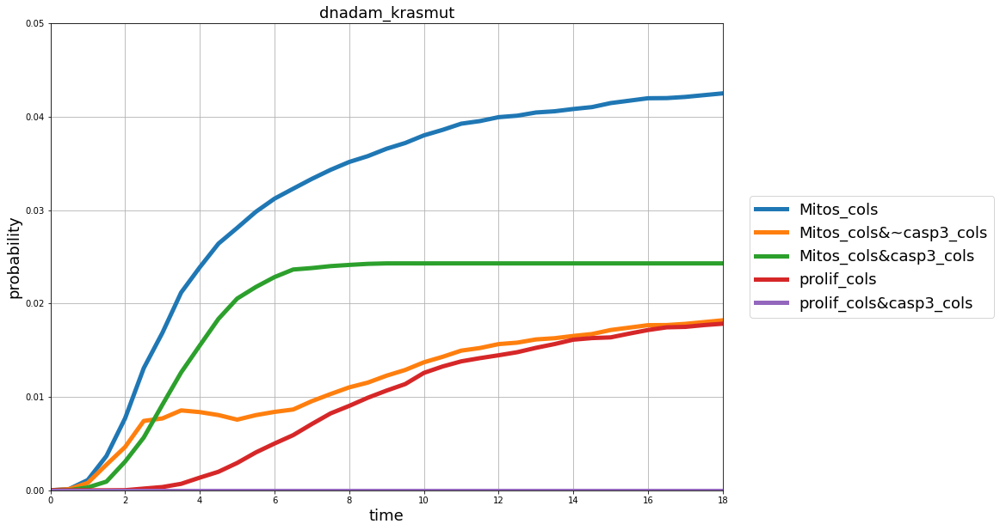

In [393]:
states_probtraj_krasmut_dnadam_chek1mk2off=krasmut_dnadam_chek1mk2off_run.get_states_probtraj()

string_cellfates=["Prolif","CASP3","Mitosis","TP53"]
cellfate_truthvals=fcn_truthval_states(states_probtraj_krasmut_dnadam_chek1mk2off,string_cellfates)
[prolif_cols,casp3_cols,Mitos_cols,tp53_cols]=cellfate_truthvals
list_truthval=[Mitos_cols,\
               Mitos_cols&~casp3_cols,\
               Mitos_cols&casp3_cols,\
              prolif_cols,\
              prolif_cols&casp3_cols]
list_labels=["Mitos_cols",\
               "Mitos_cols&~casp3_cols",\
               "Mitos_cols&casp3_cols",\
              "prolif_cols",\
              "prolif_cols&casp3_cols"]
str_plotname="_krasmut"; plot_pars=[14,10,18,5,0.05,18]; model_name='dnadam'
plot_cell_fates(states_probtraj_krasmut_dnadam_chek1mk2off,model_name,\
                str_plotname,plot_pars,list_truthval,list_labels,"")
plt.grid()